In [1]:
import datetime
import time
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.optimizers import SGD
from sklearn.preprocessing import MinMaxScaler
from keras import metrics


from statsmodels.compat.pandas import deprecate_kwarg
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
# additive decompose a contrived additive time series
from random import randrange
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose 

# the main library has a small set of functionality
from stldecompose import decompose, forecast
from stldecompose.forecast_funcs import (naive,
                                         drift, 
                                         mean, 
                                         seasonal_naive)
%load_ext autoreload
%autoreload 2
import tensorflow as tf


In [2]:
print(tf.__version__)

2.2.0


In [3]:
data = pd.read_csv('/Users/alket/Desktop/dati/new_data_backfill_forwfill.csv', index_col = 0, 
                   header=0, parse_dates=True)

In [4]:
agg_by_cell = data.groupby(by = ['cell_num'])
print(len(agg_by_cell), 'celle')

221 celle


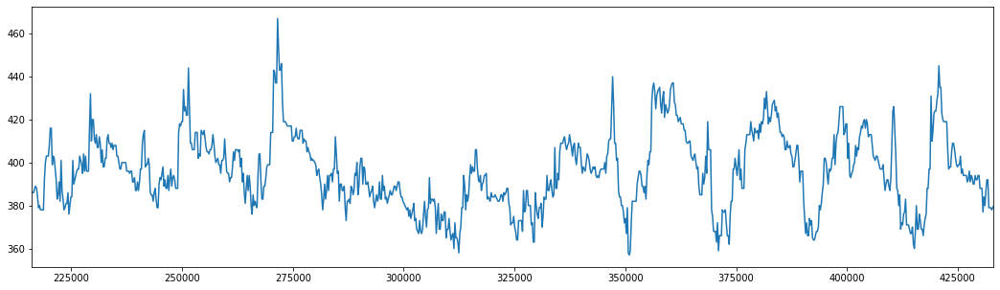

In [5]:
serie_dati = agg_by_cell.get_group('496-1255')
plt.figure(figsize = (18,5))
#one_cell.set_index('date')
serie_dati['nr_people'][977:1960].plot()
plt.show()

486-1252


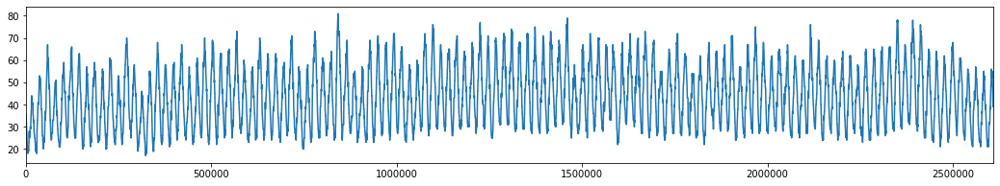

486-1253


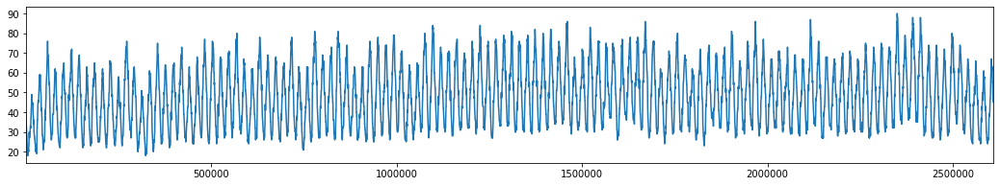

486-1254


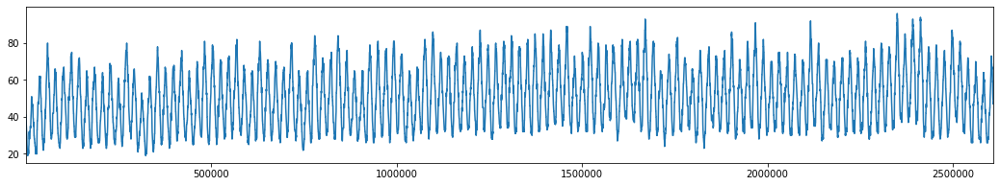

486-1255


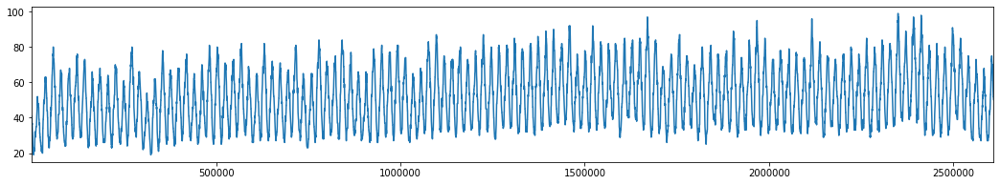

486-1256


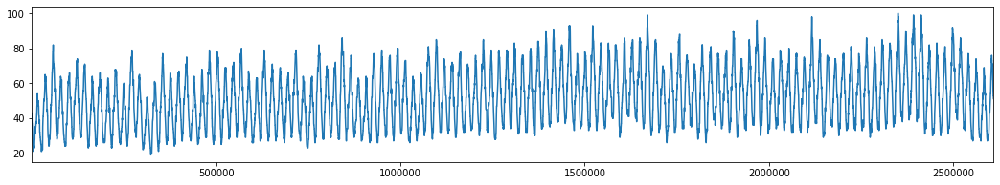

486-1257


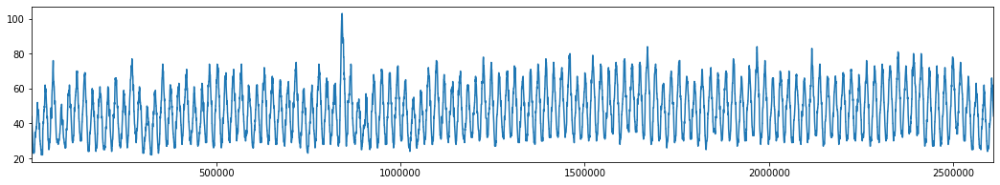

486-1258


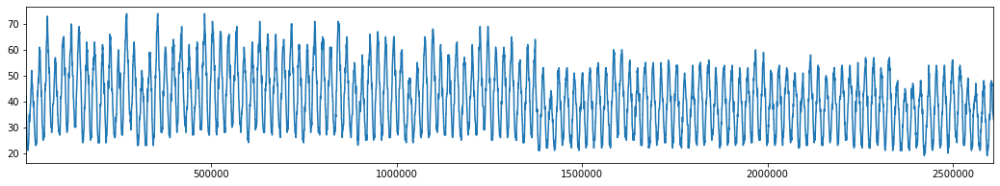

486-1259


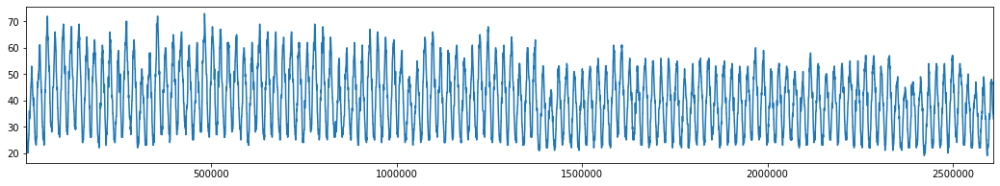

486-1260


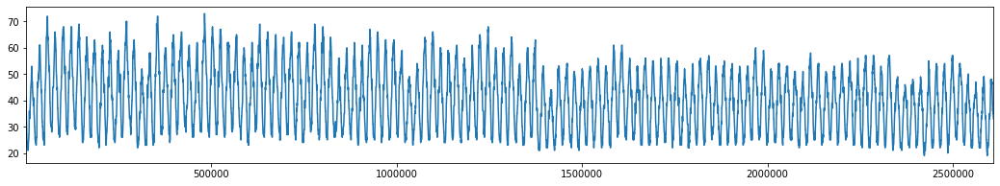

486-1261


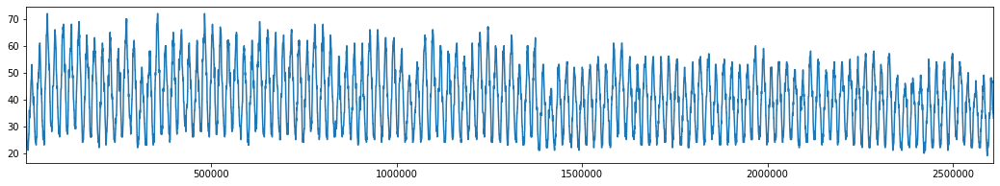

486-1262


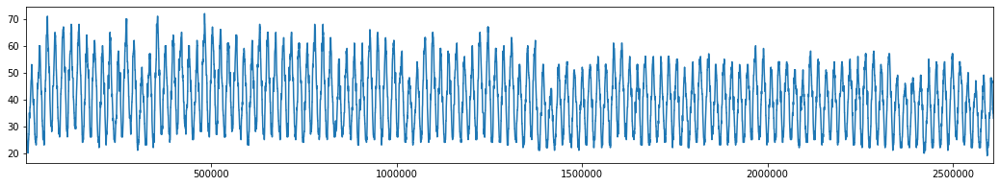

486-1263


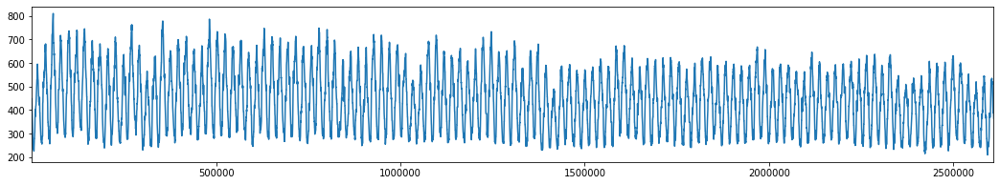

486-1264


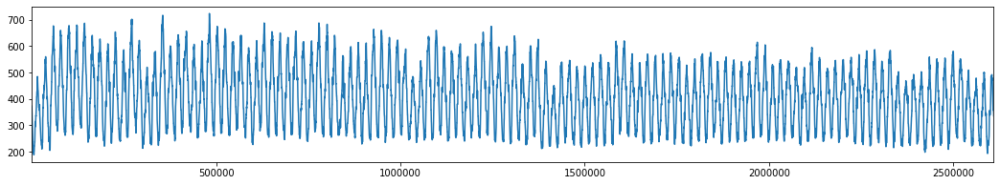

486-1265


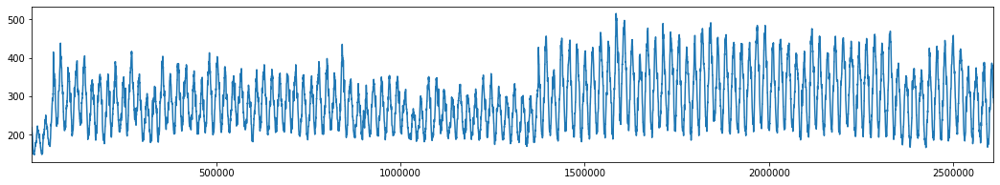

486-1266


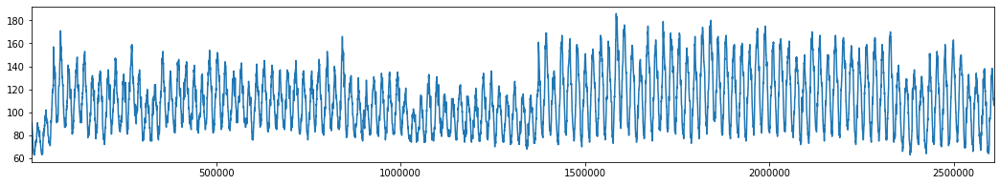

486-1267


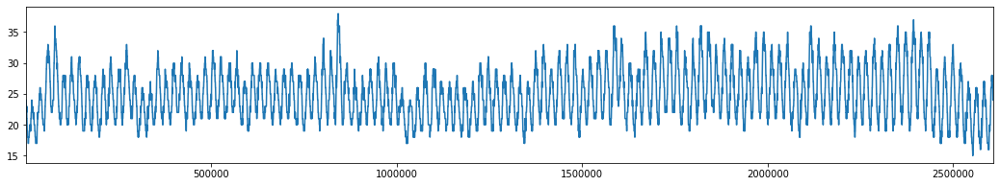

486-1268


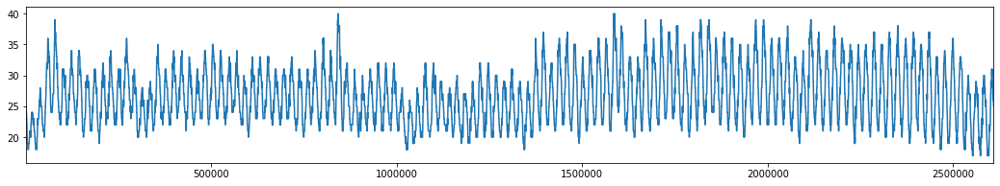

487-1252


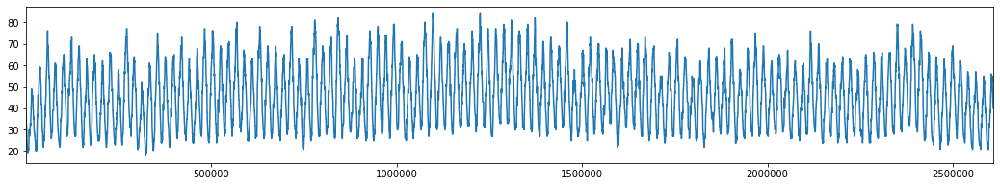

487-1253


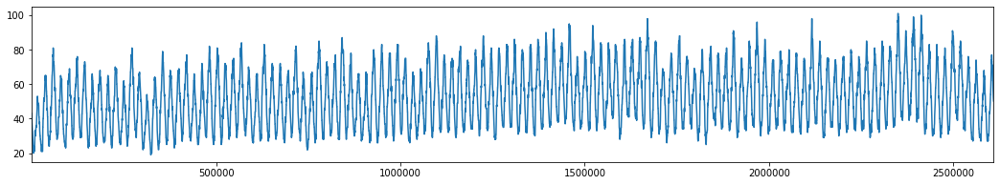

487-1254


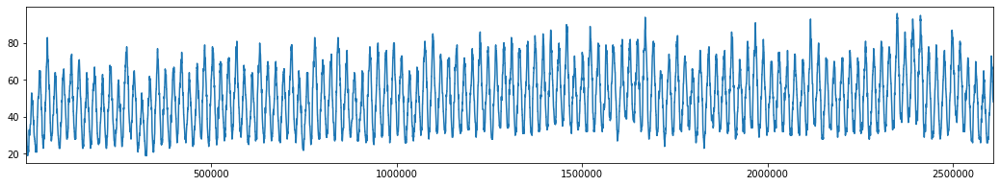

487-1255


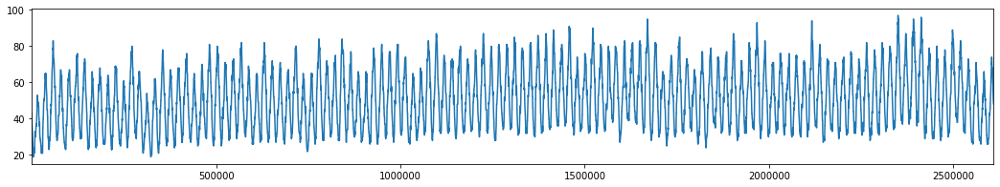

487-1256


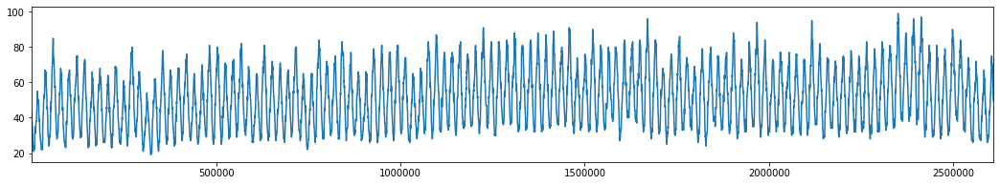

487-1257


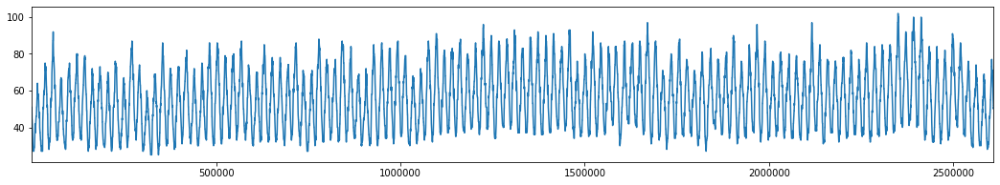

487-1258


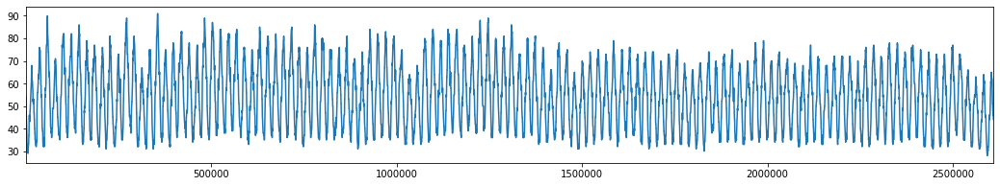

487-1259


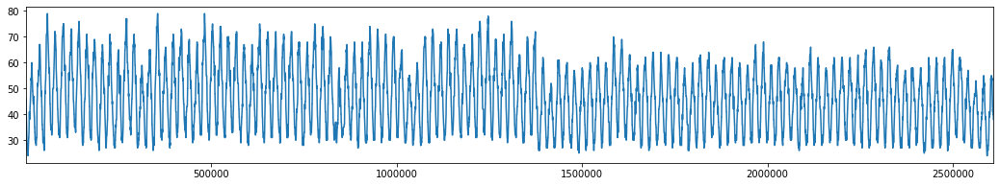

487-1260


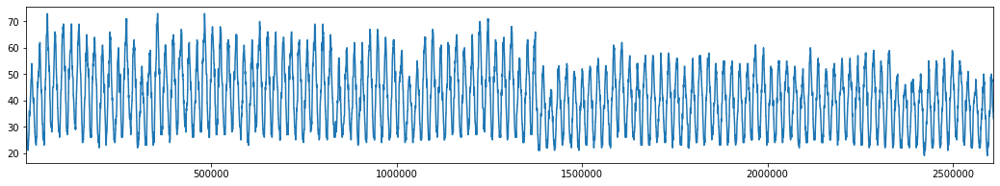

487-1261


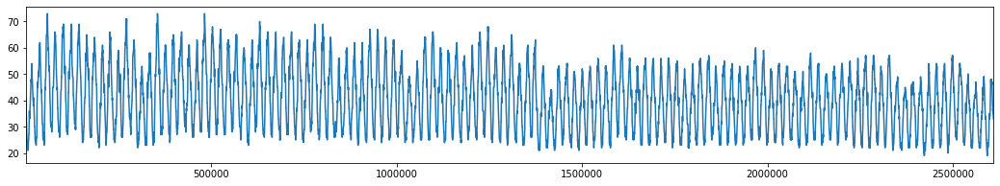

487-1262


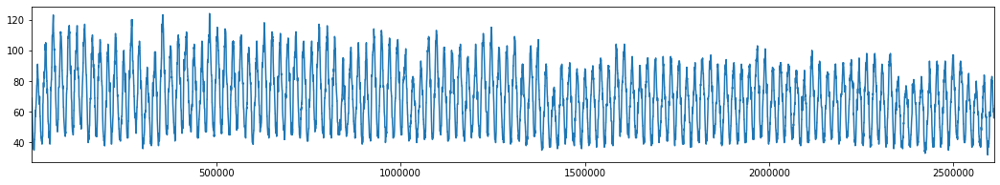

487-1263


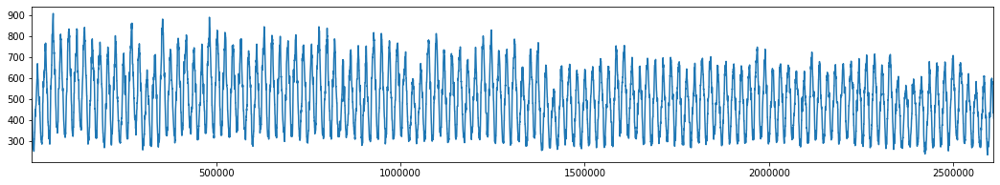

487-1264


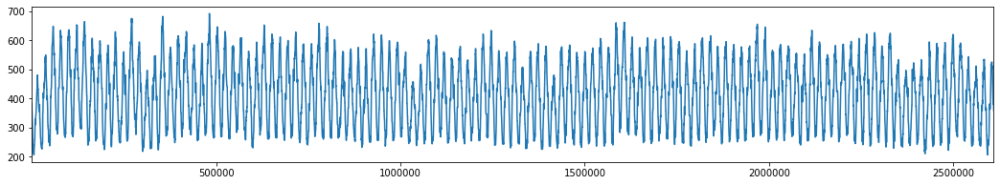

487-1265


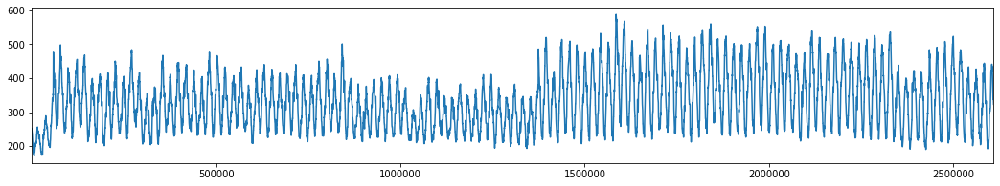

487-1266


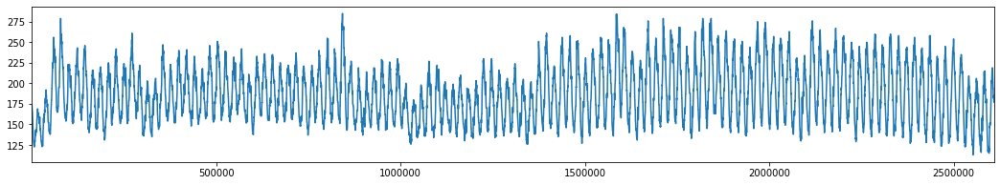

487-1267


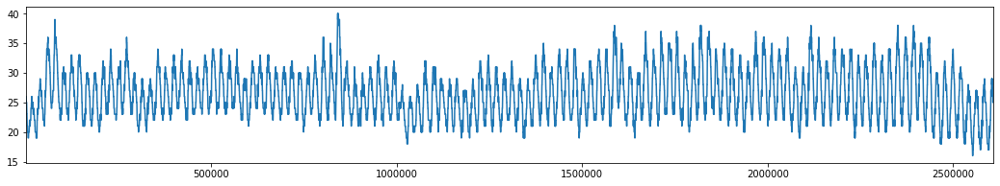

487-1268


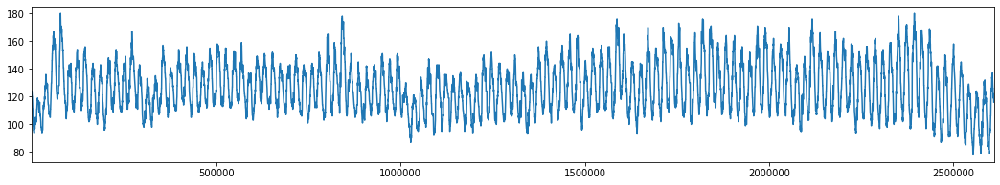

488-1252


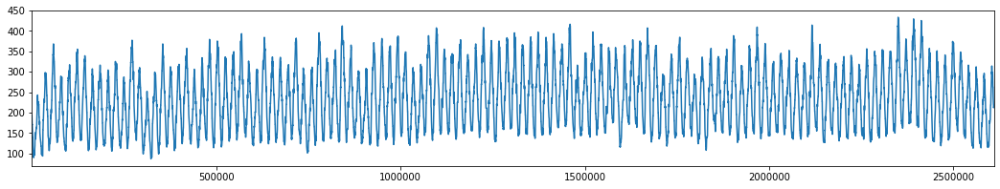

488-1253


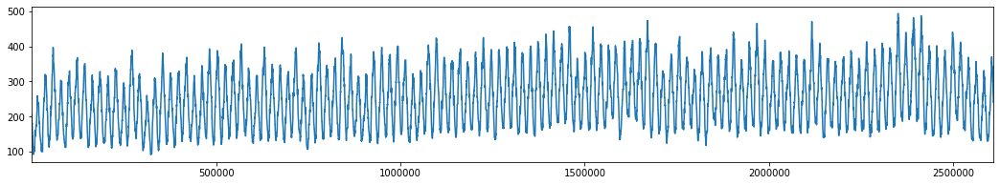

488-1254


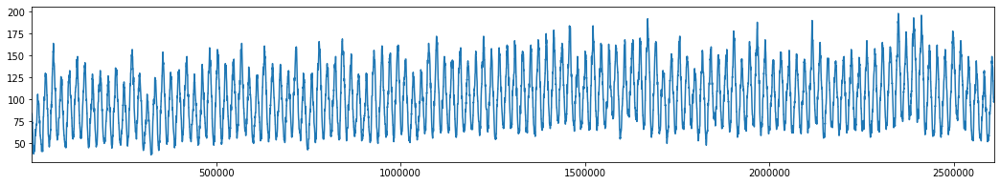

488-1255


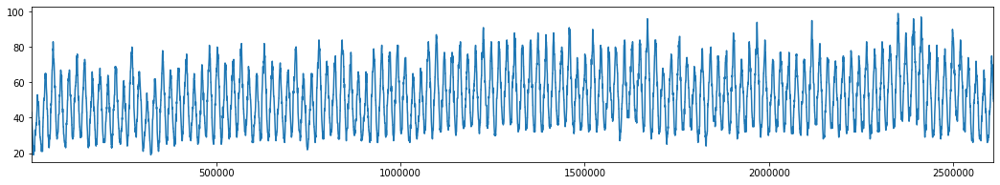

488-1256


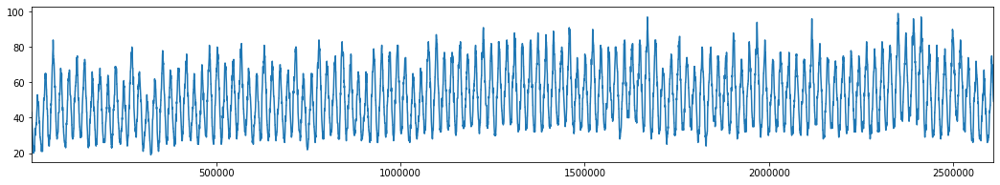

488-1257


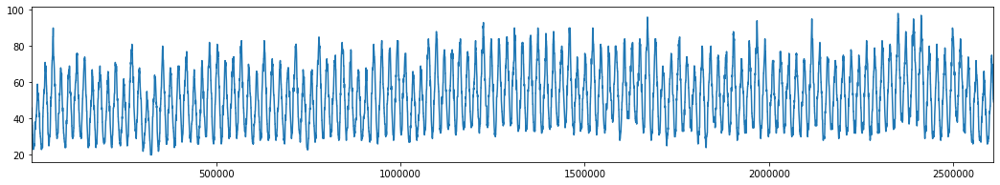

488-1258


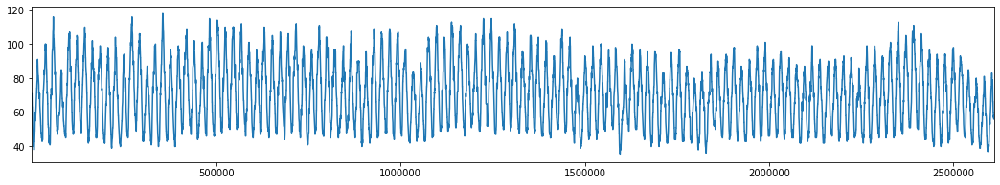

488-1259


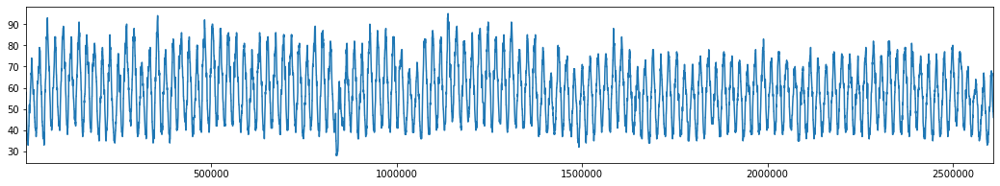

488-1260


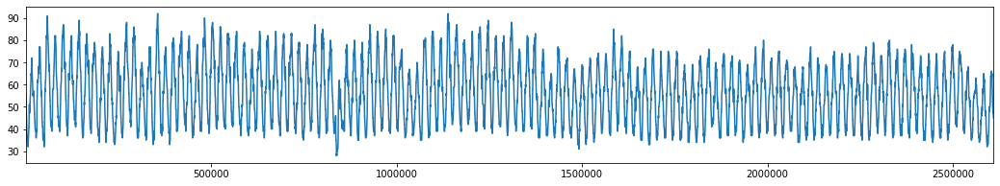

488-1261


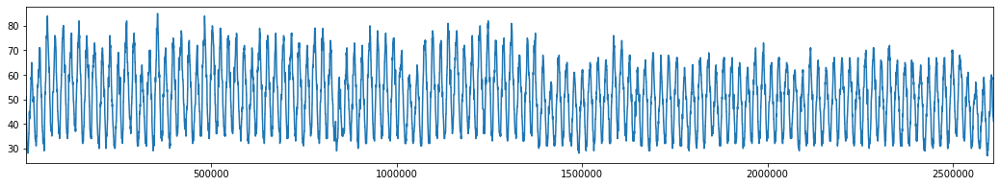

488-1262


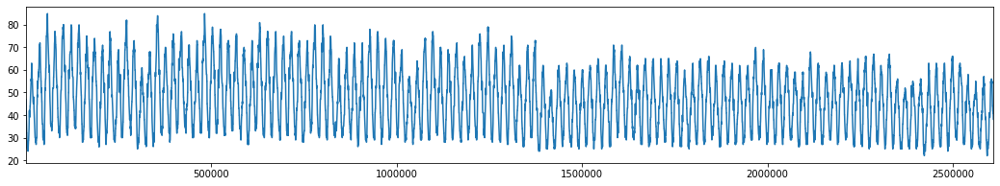

488-1263


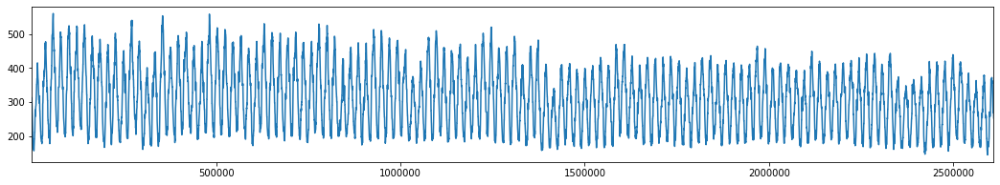

488-1264


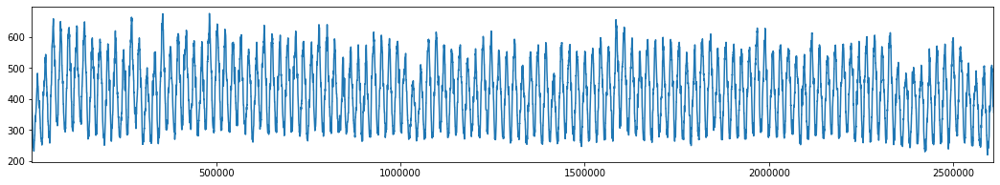

488-1265


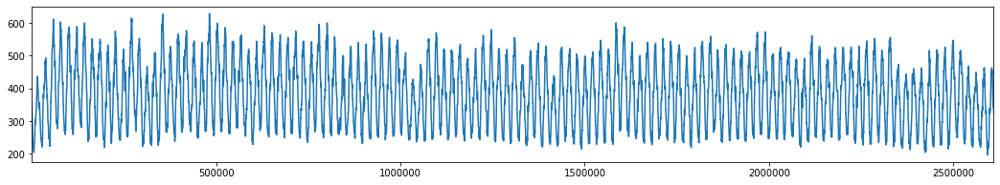

488-1266


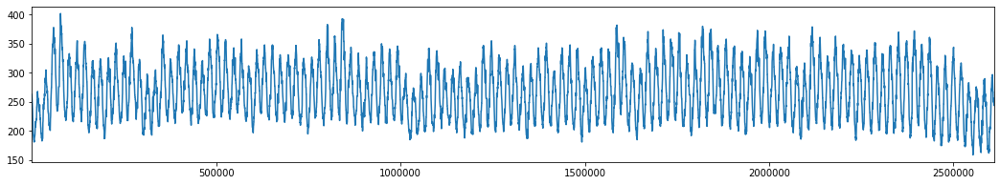

488-1267


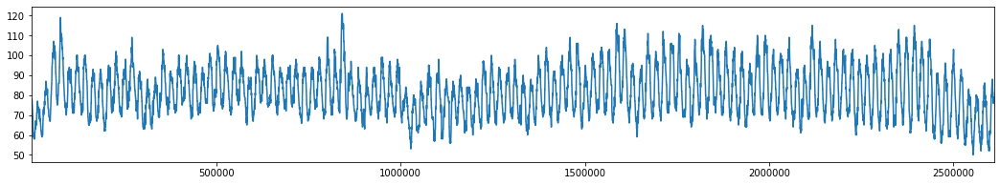

488-1268


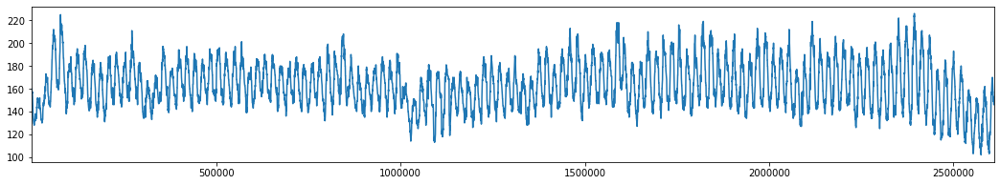

489-1252


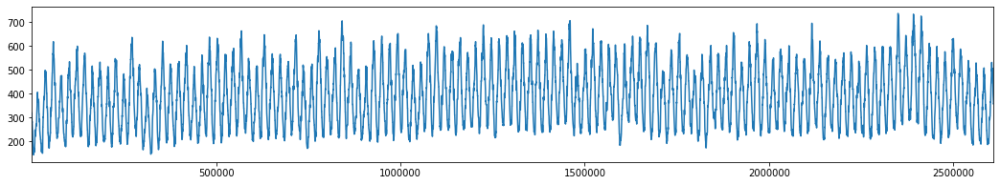

489-1253


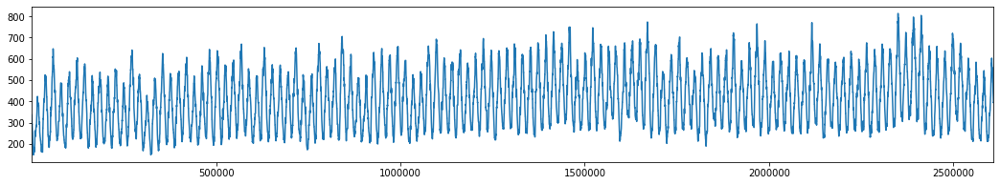

489-1254


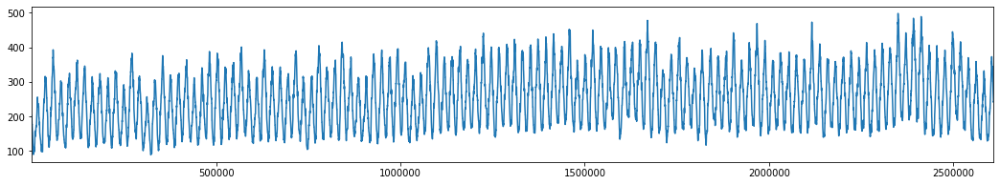

489-1255


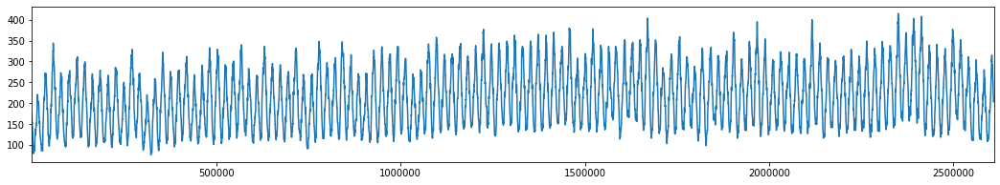

489-1256


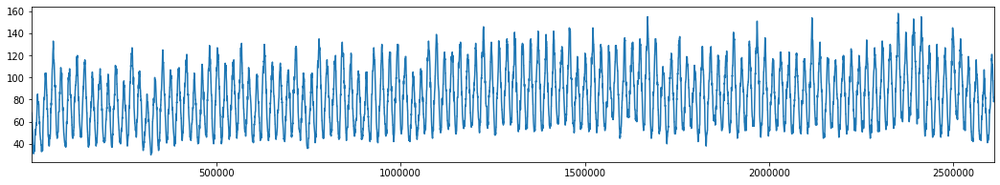

489-1257


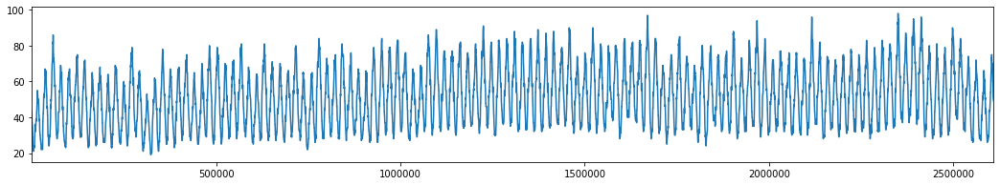

489-1258


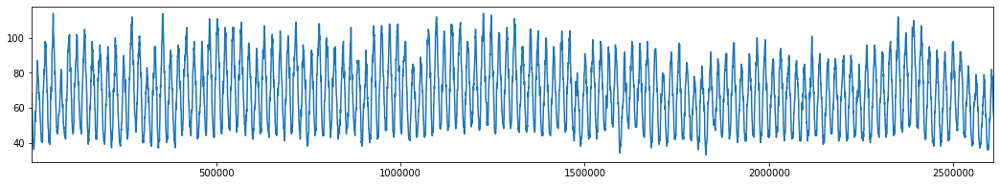

489-1259


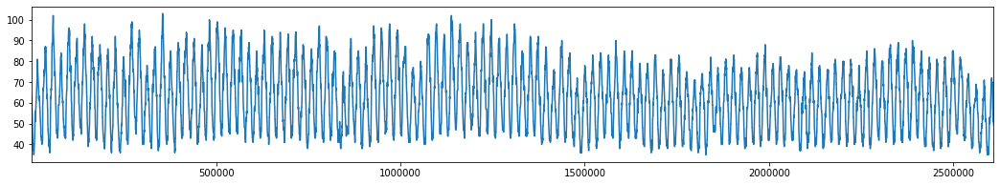

489-1260


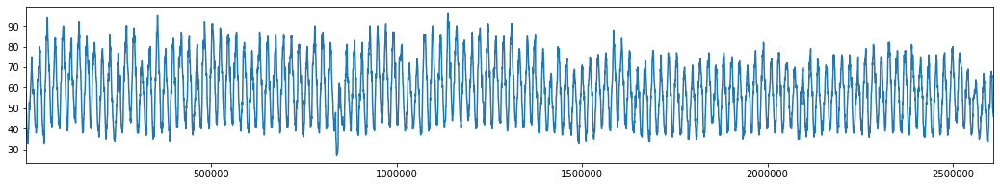

489-1261


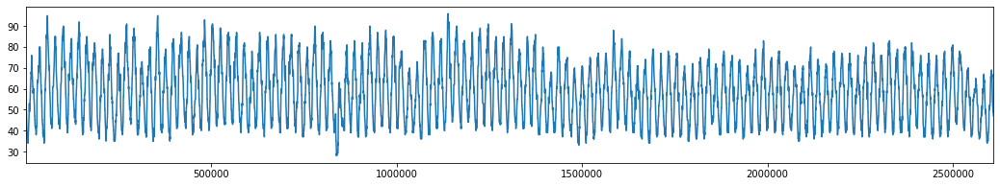

489-1262


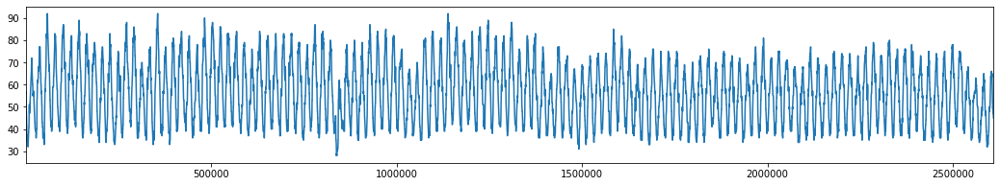

489-1263


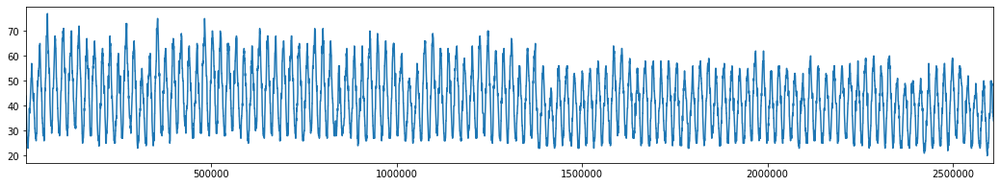

489-1264


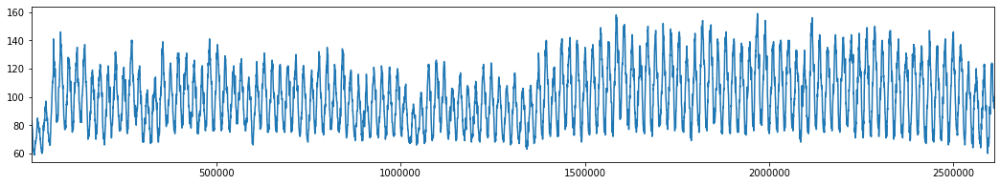

489-1265


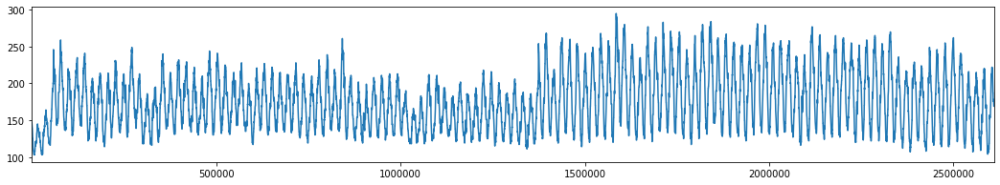

489-1266


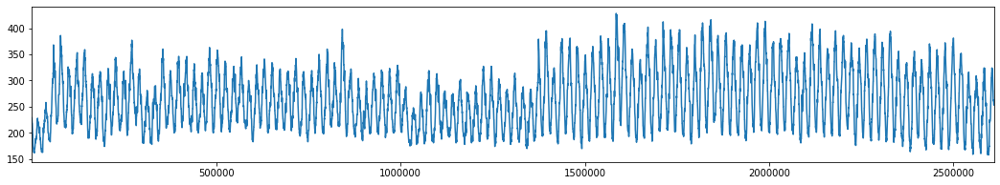

489-1267


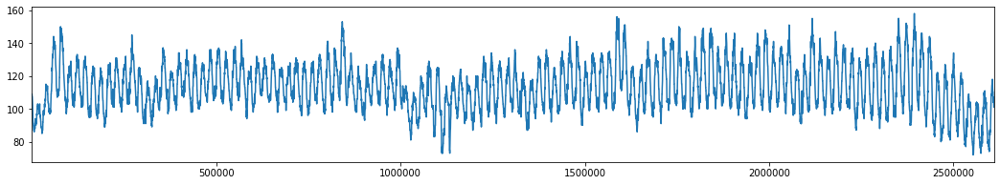

489-1268


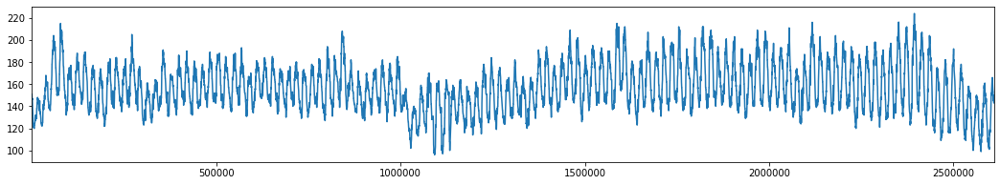

490-1252


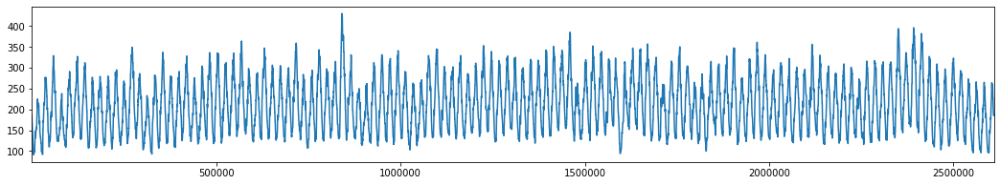

490-1253


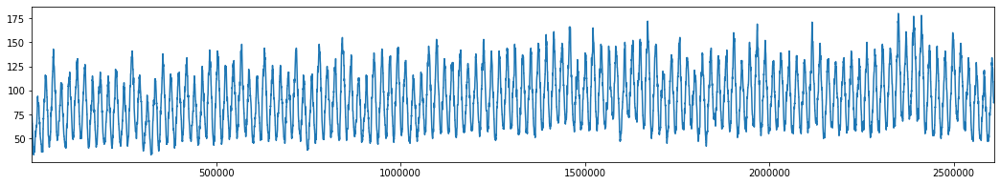

490-1254


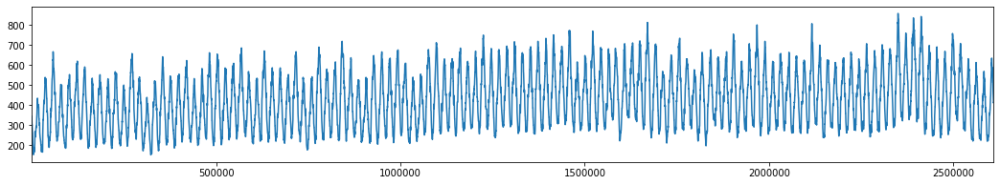

490-1255


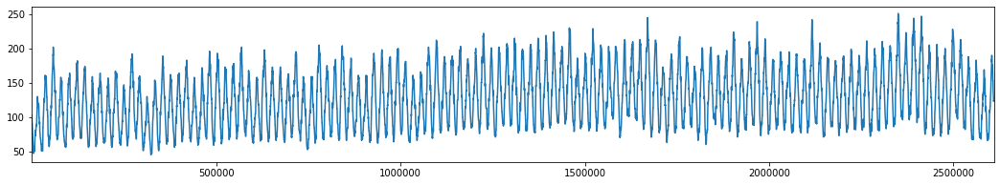

490-1256


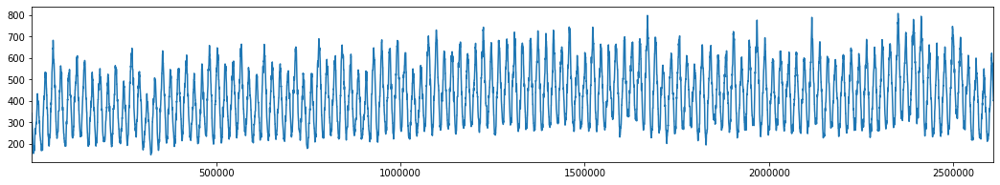

490-1257


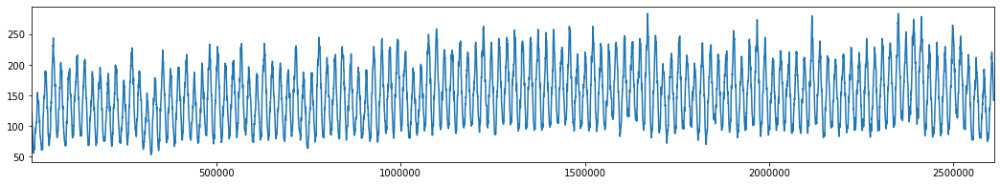

490-1258


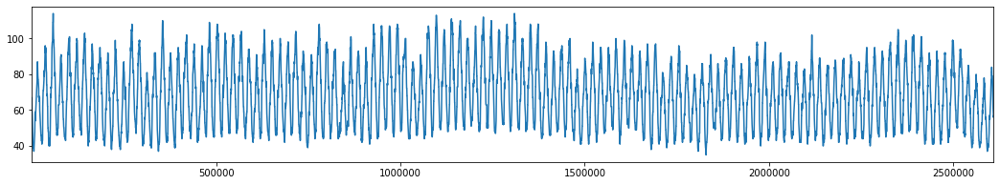

490-1259


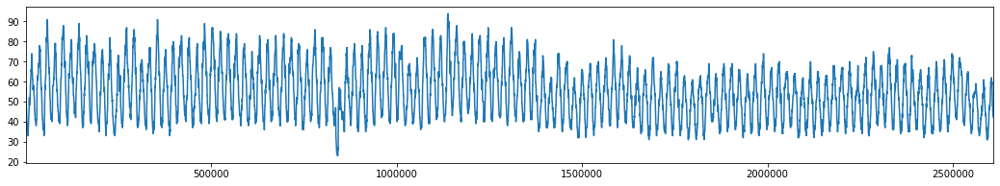

490-1260


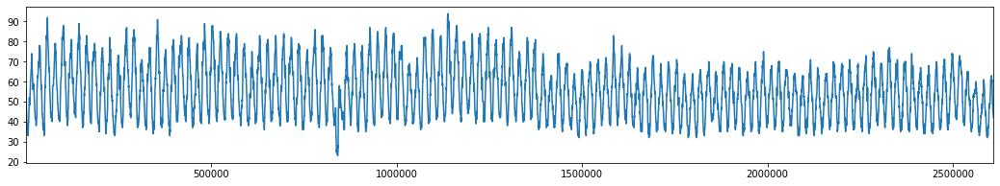

490-1261


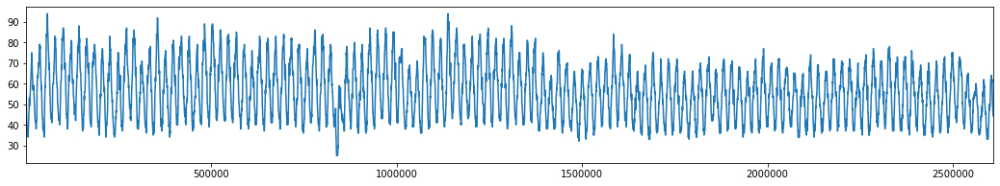

490-1262


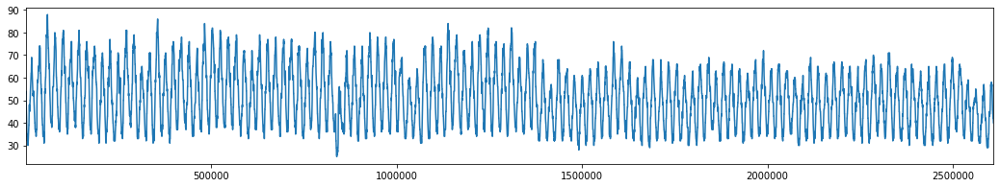

490-1263


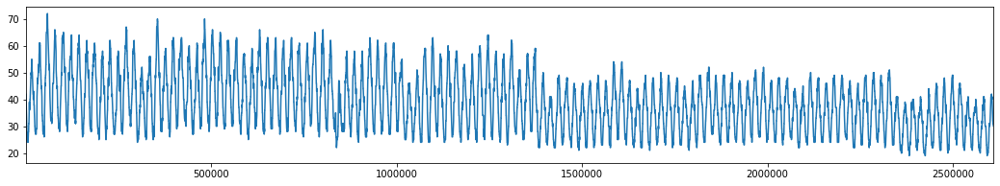

490-1264


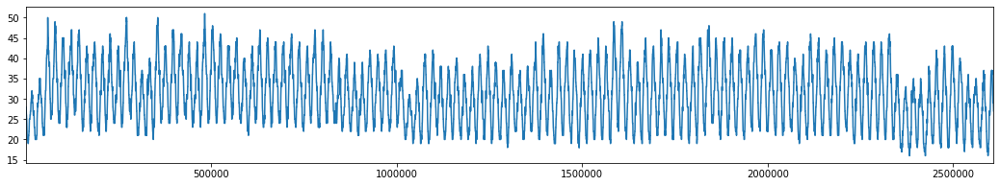

490-1265


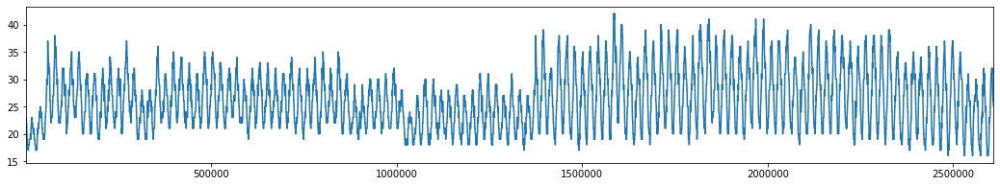

490-1266


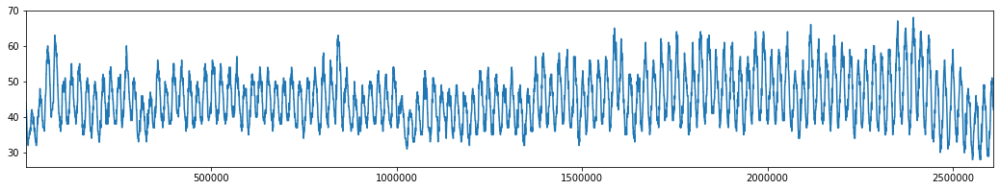

490-1267


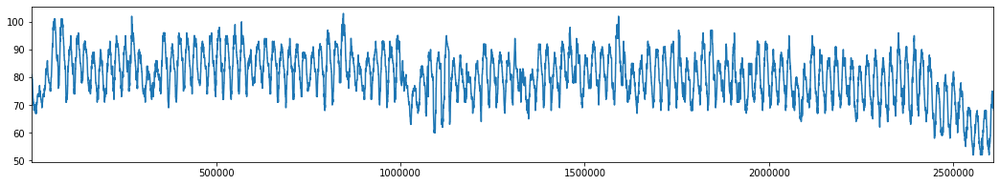

490-1268


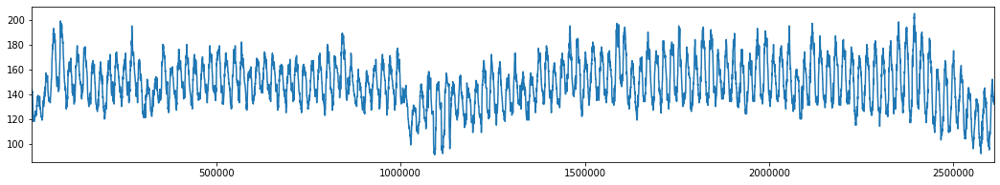

491-1252


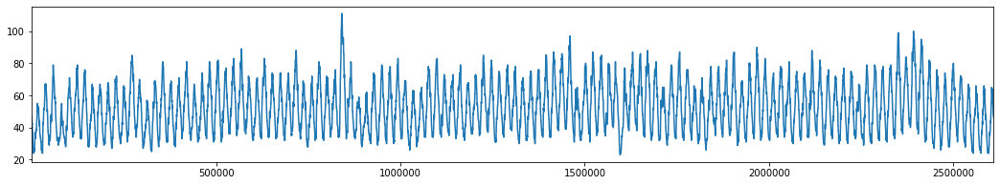

491-1253


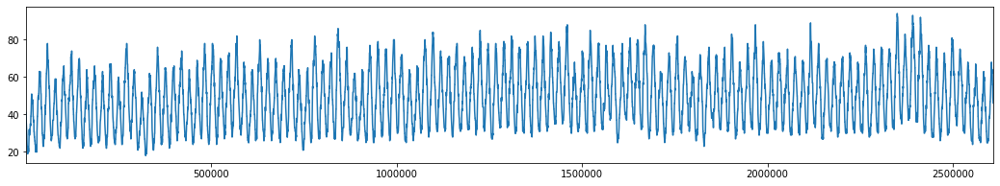

491-1254


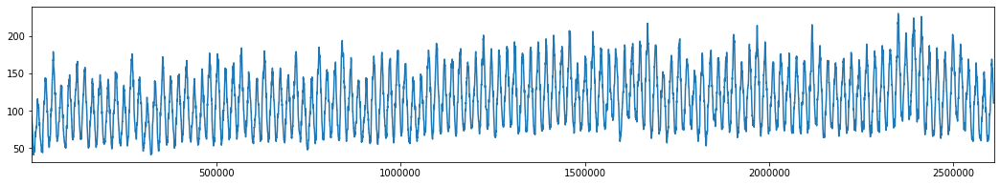

491-1255


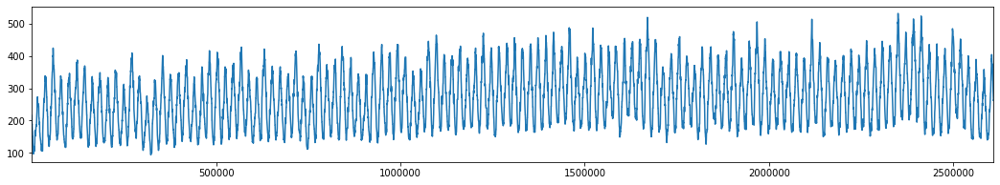

491-1256


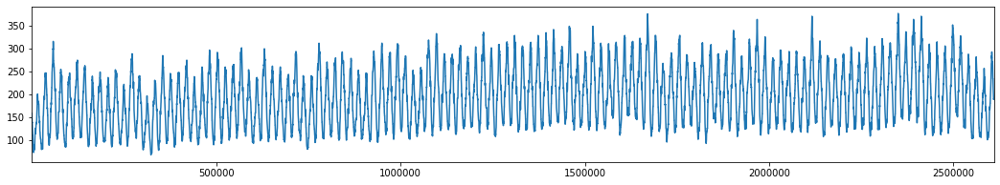

491-1257


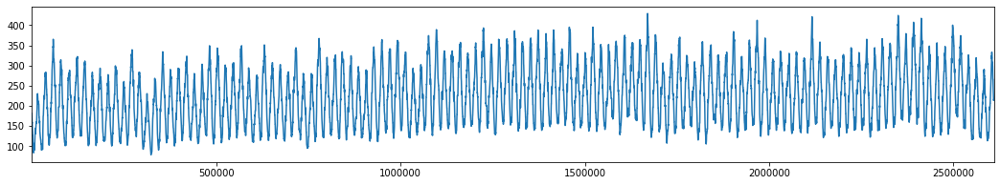

491-1258


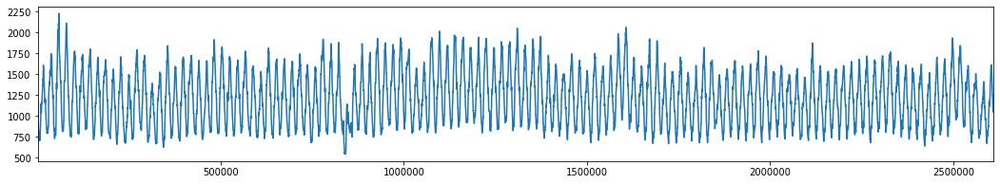

491-1259


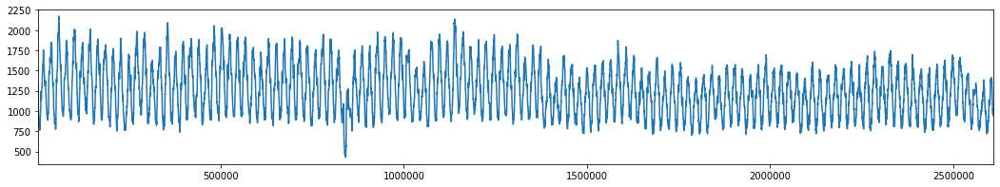

491-1260


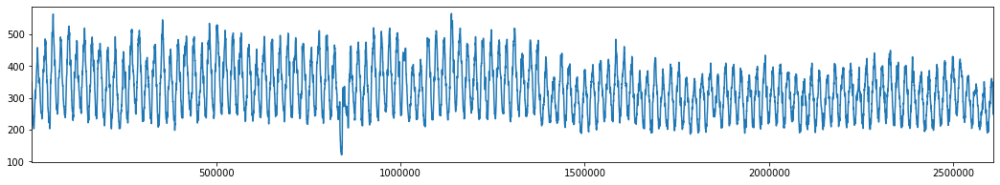

491-1261


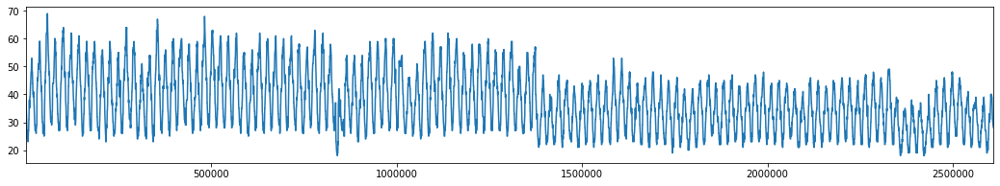

491-1262


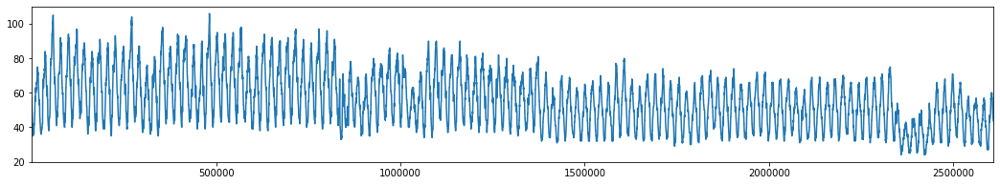

491-1263


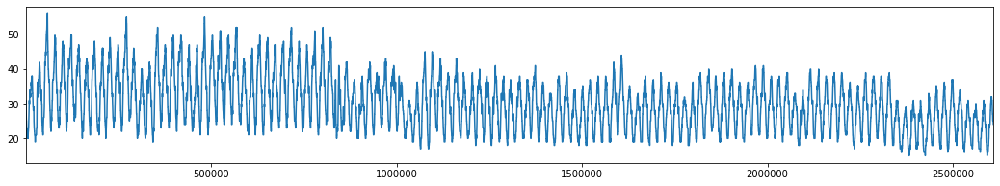

491-1264


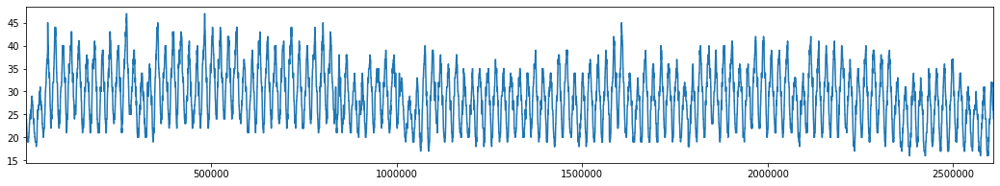

491-1265


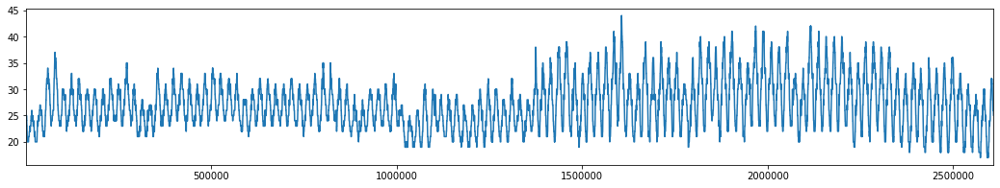

491-1266


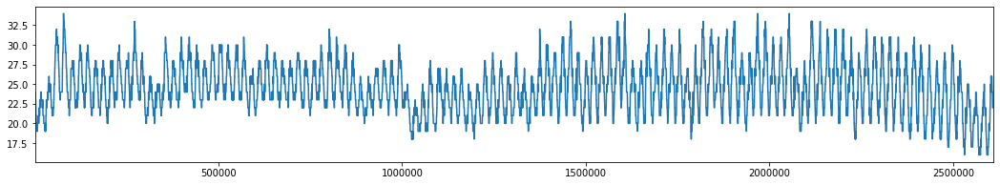

491-1267


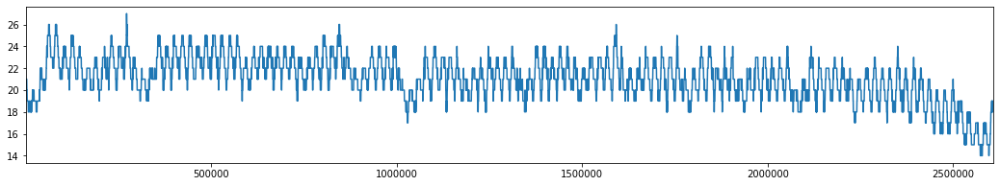

491-1268


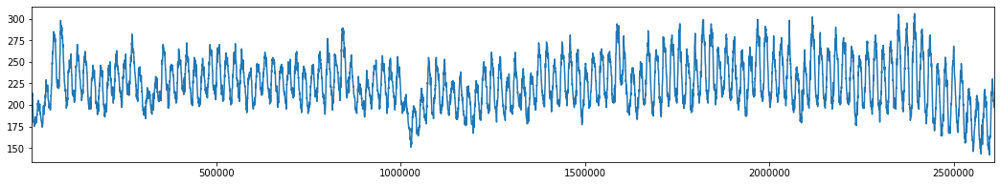

492-1252


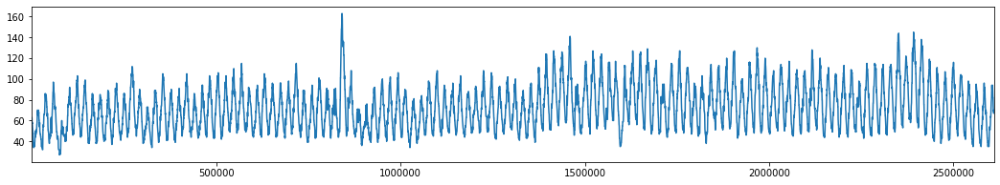

492-1253


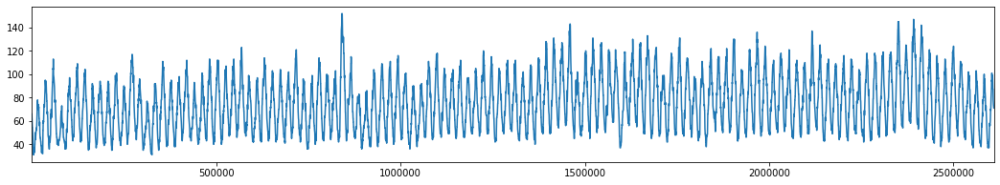

492-1254


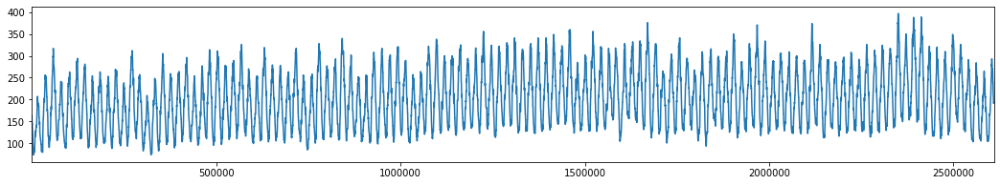

492-1255


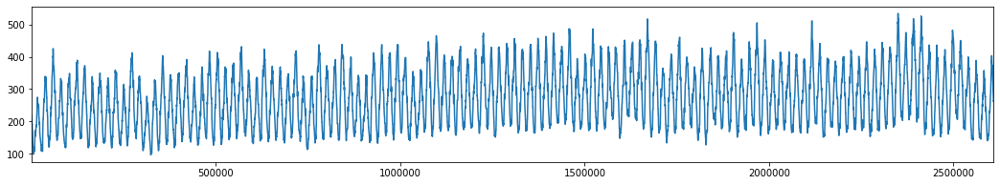

492-1256


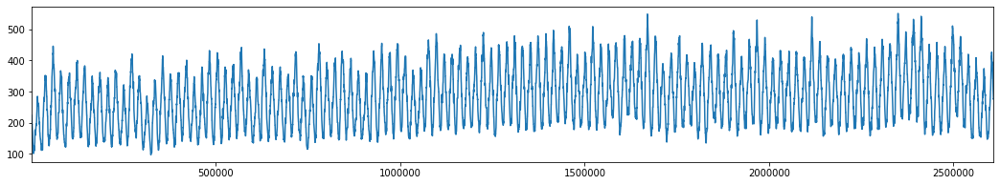

492-1257


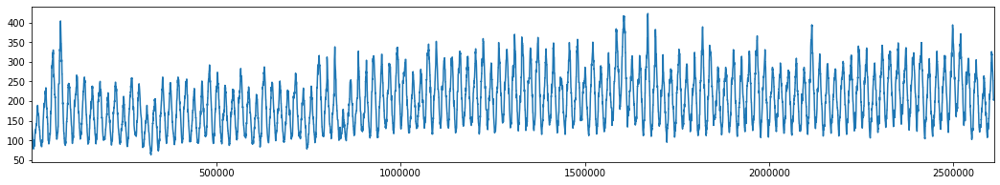

492-1258


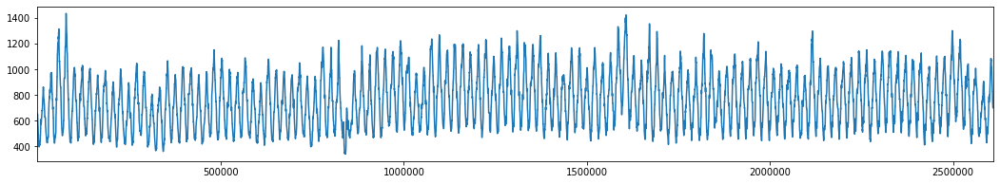

492-1259


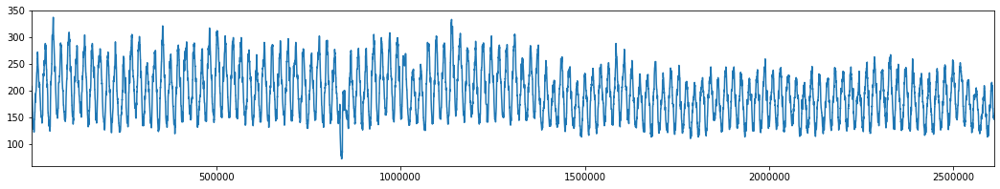

492-1260


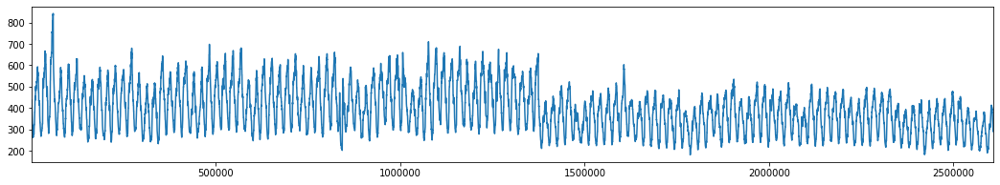

492-1261


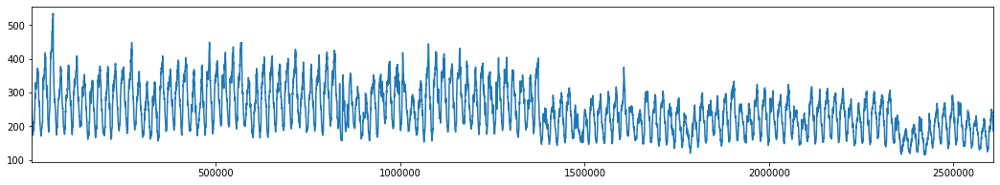

492-1262


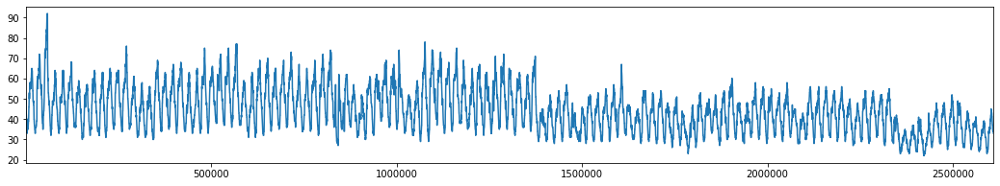

492-1263


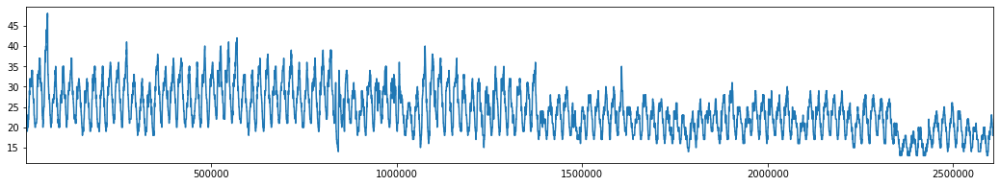

492-1264


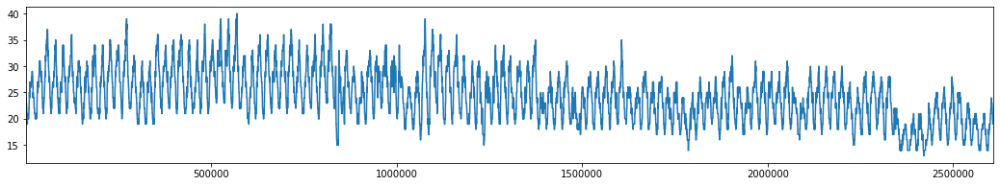

492-1265


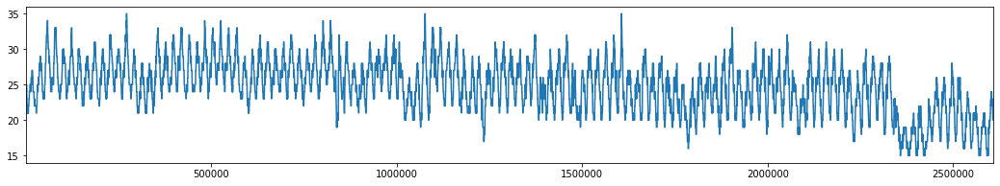

492-1266


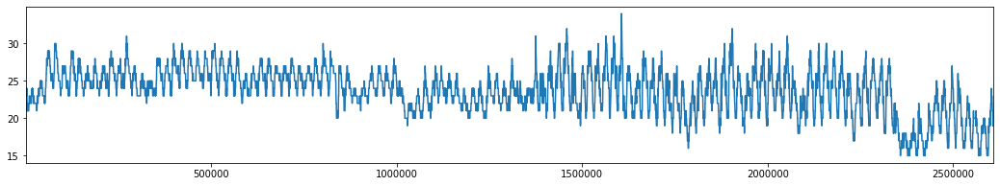

492-1267


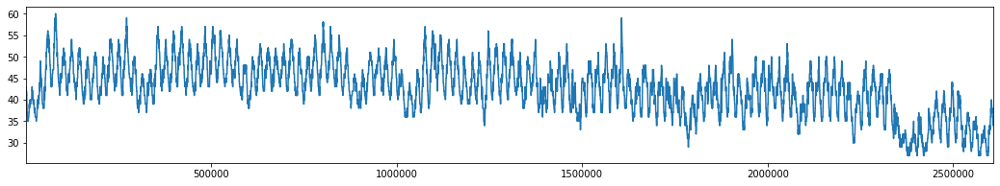

492-1268


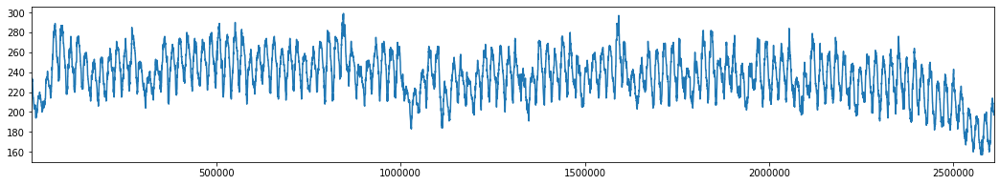

493-1252


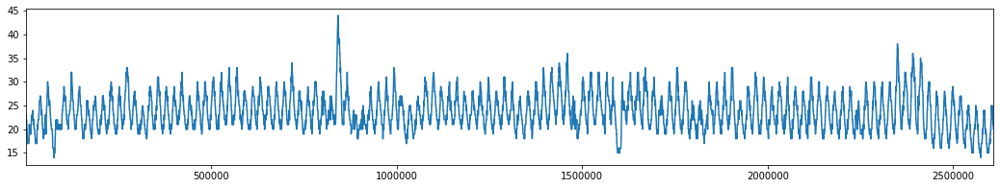

493-1253


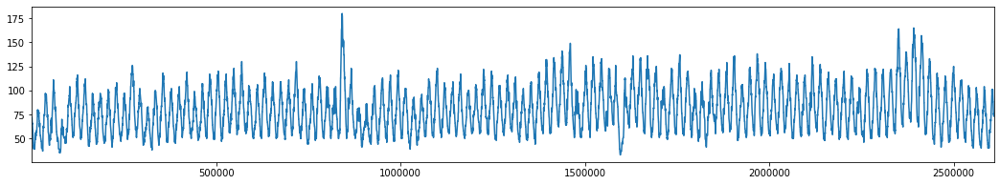

493-1254


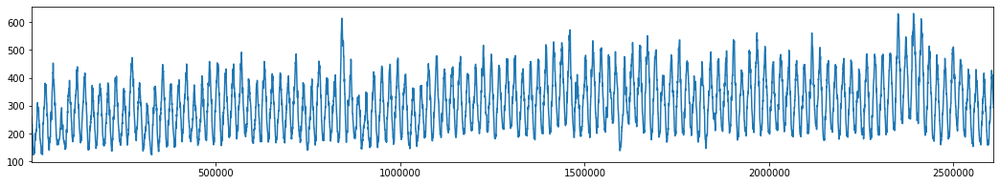

493-1255


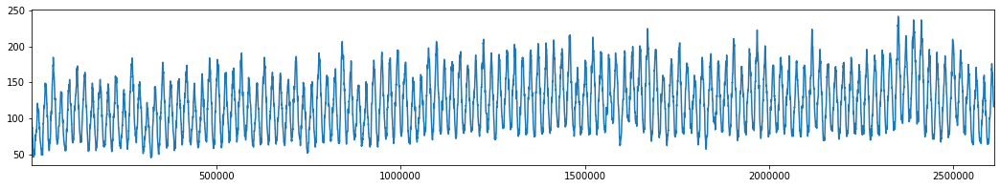

493-1256


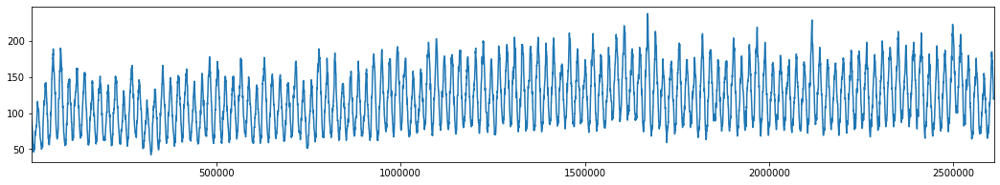

493-1257


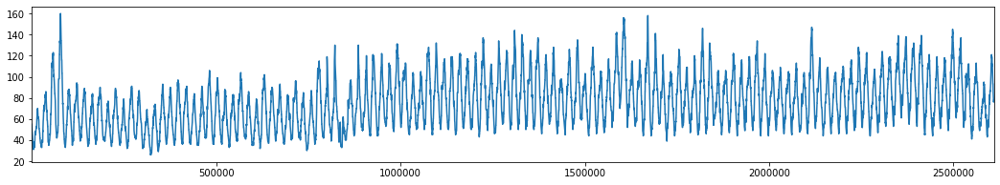

493-1258


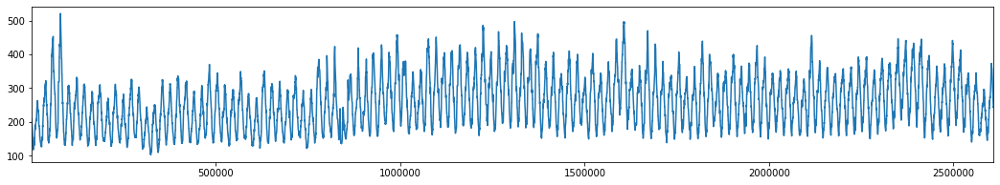

493-1259


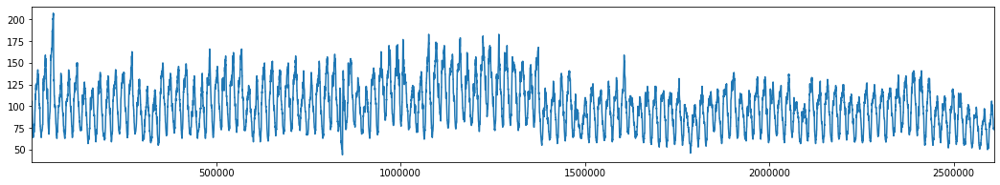

493-1260


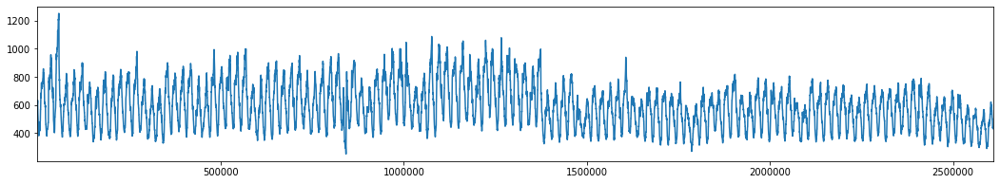

493-1261


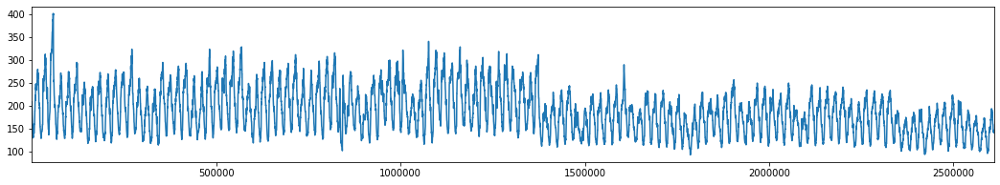

493-1262


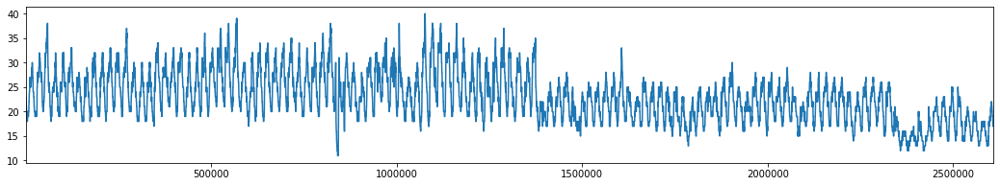

493-1263


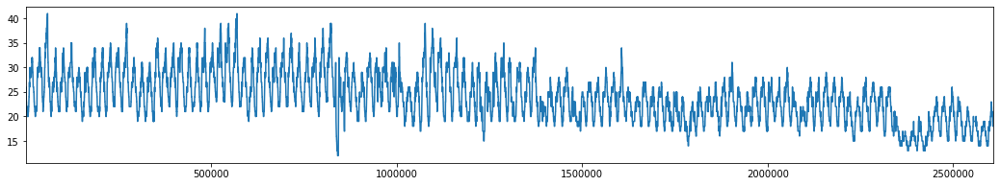

493-1264


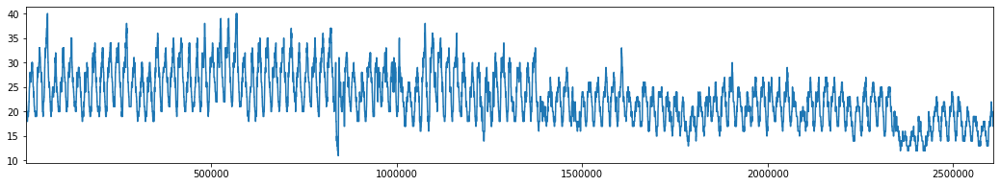

493-1265


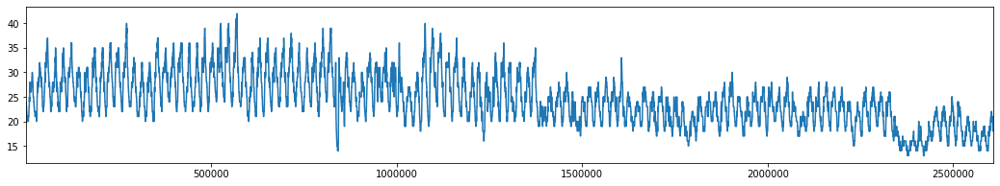

493-1266


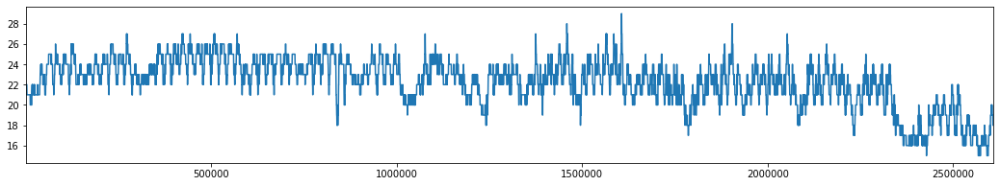

493-1267


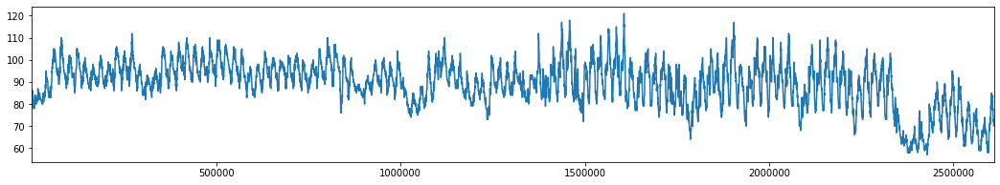

493-1268


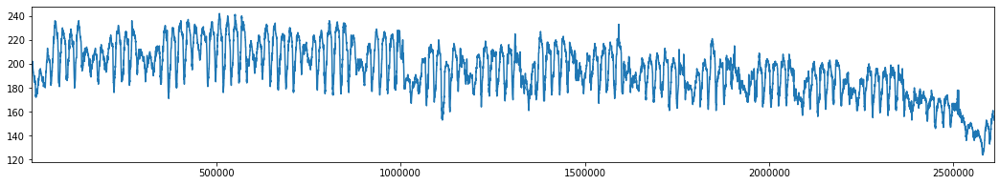

494-1252


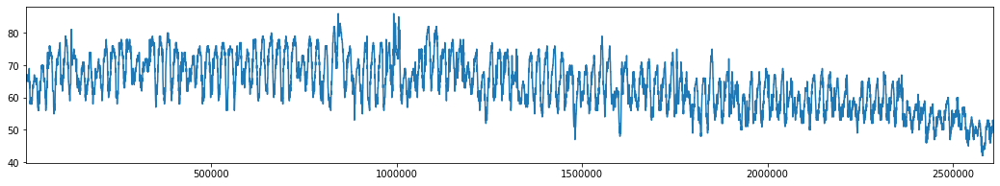

494-1253


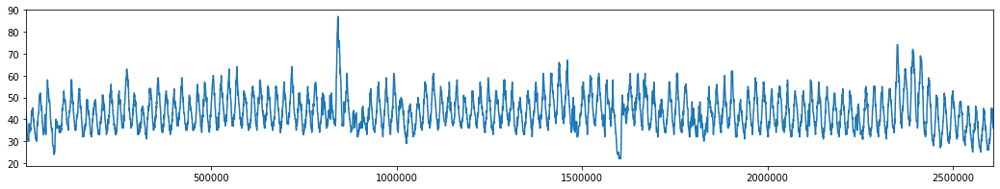

494-1254


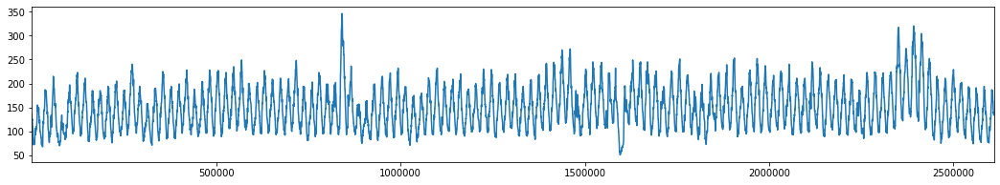

494-1255


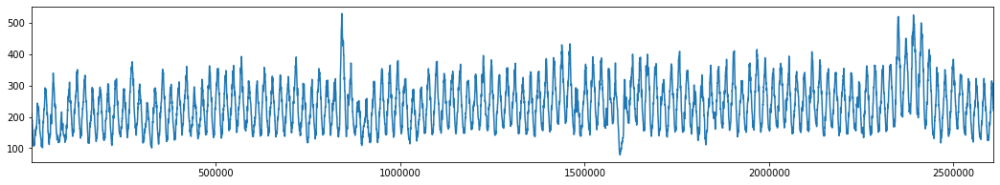

494-1256


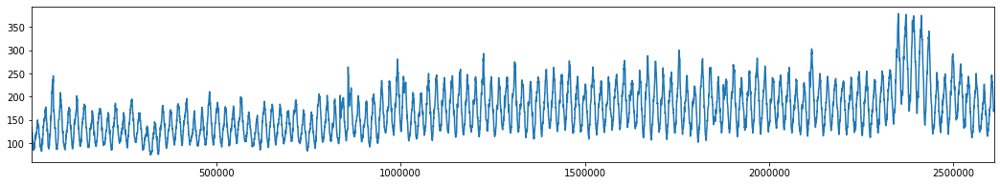

494-1257


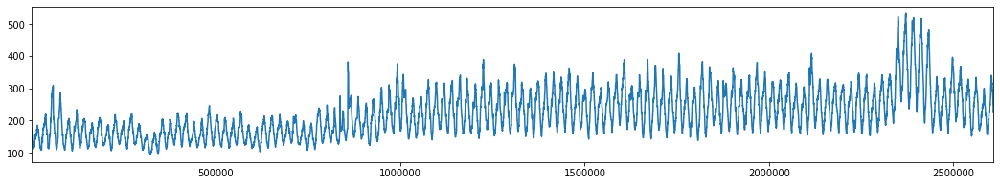

494-1258


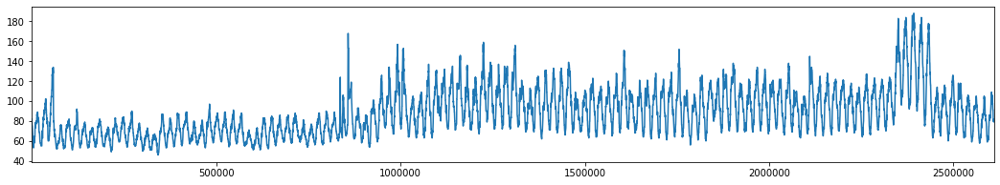

494-1259


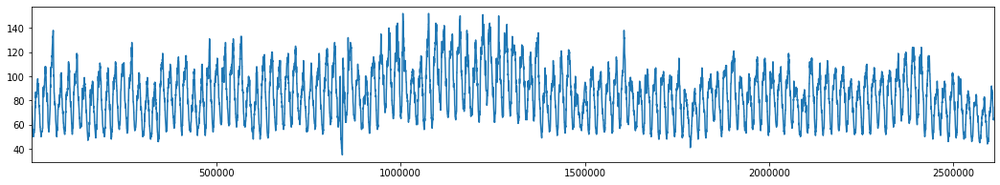

494-1260


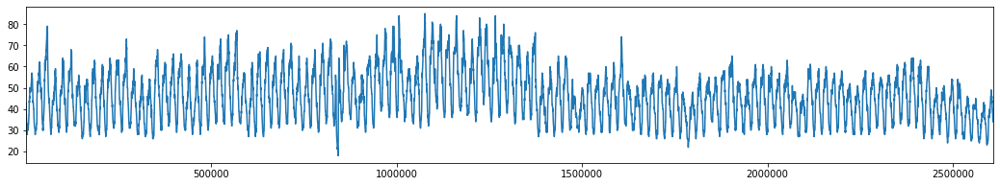

494-1261


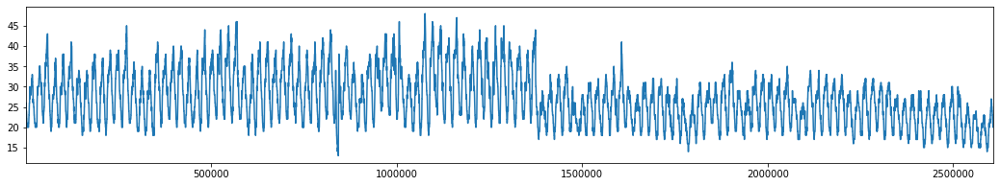

494-1262


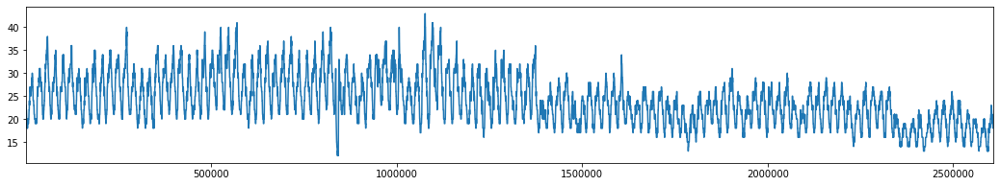

494-1263


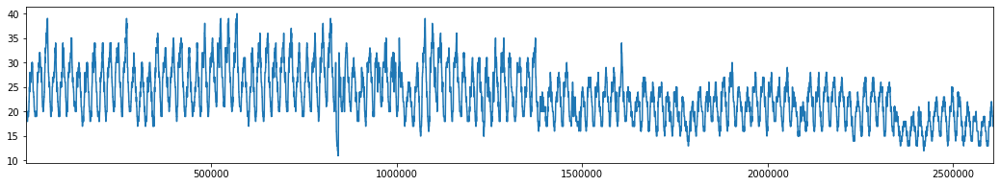

494-1264


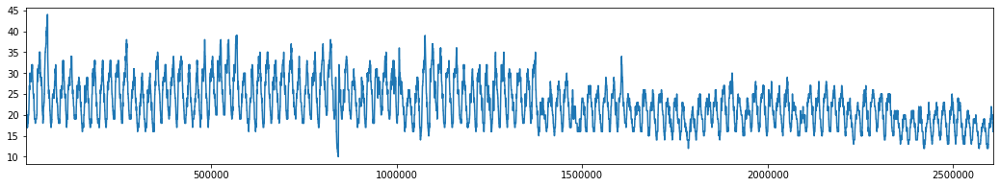

494-1265


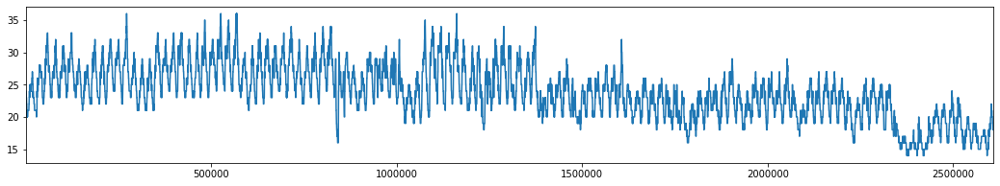

494-1266


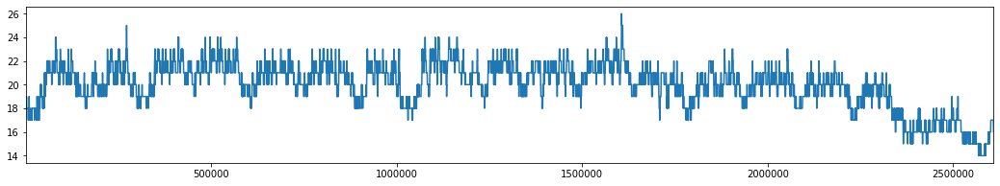

494-1267


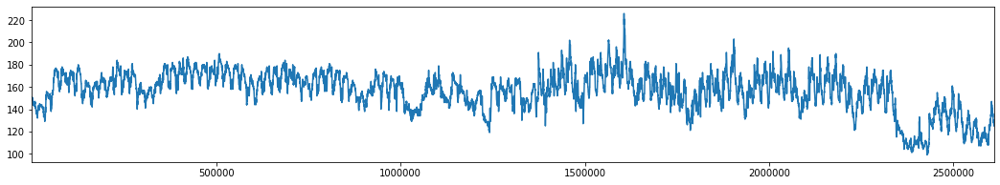

494-1268


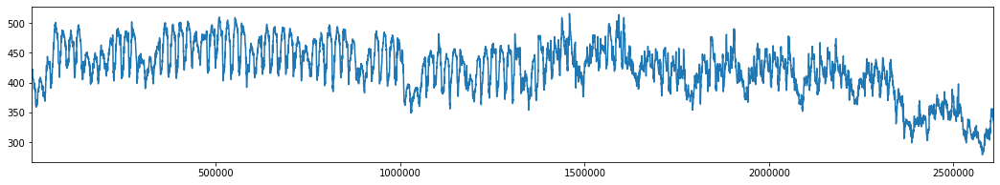

495-1252


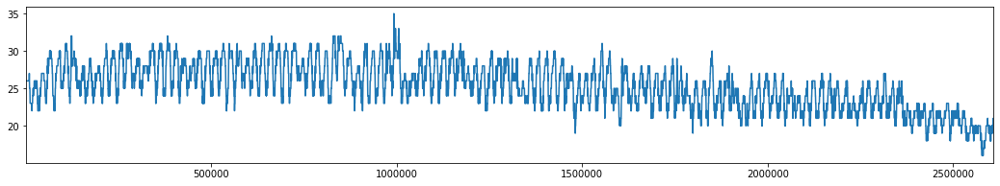

495-1253


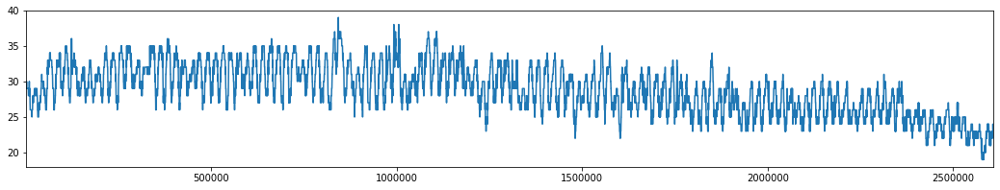

495-1254


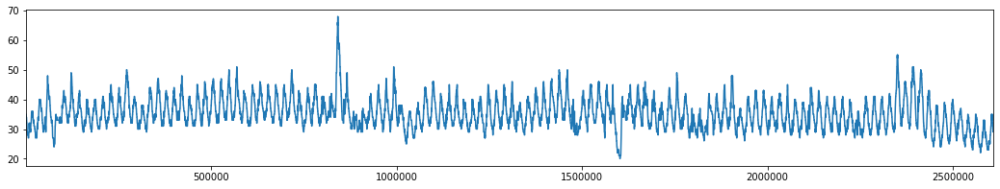

495-1255


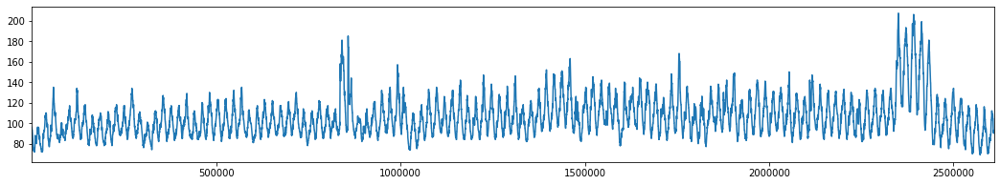

495-1256


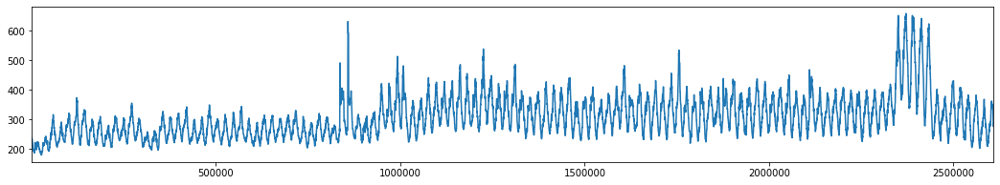

495-1257


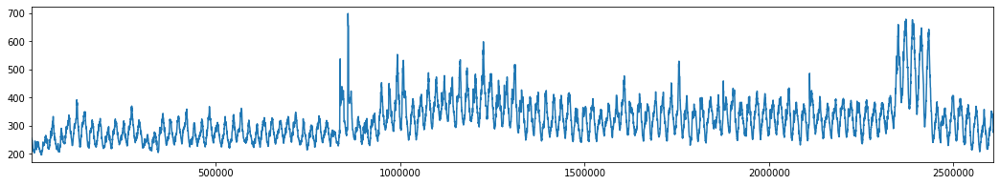

495-1258


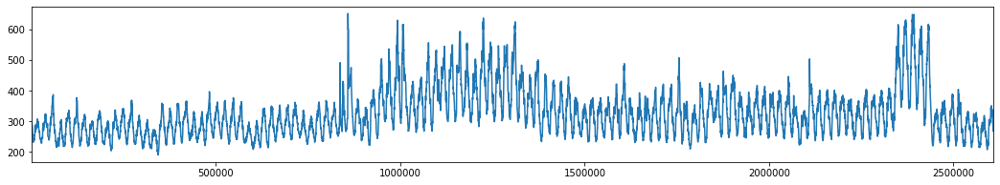

495-1259


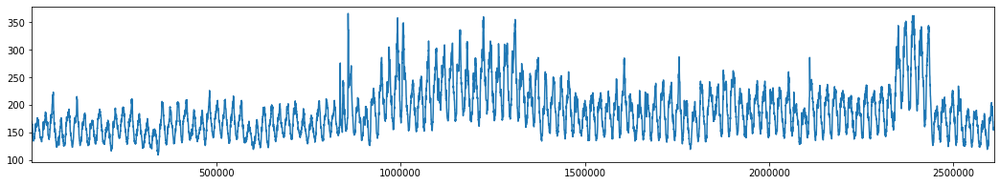

495-1260


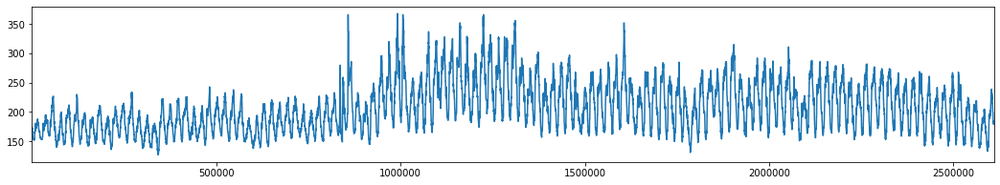

495-1261


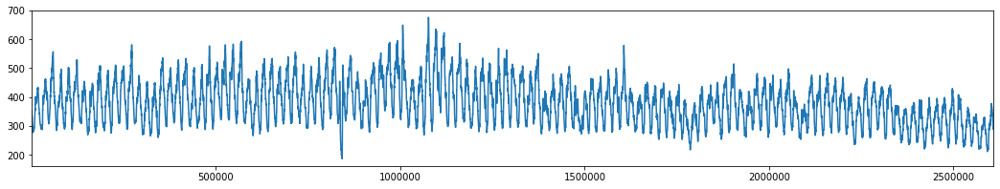

495-1262


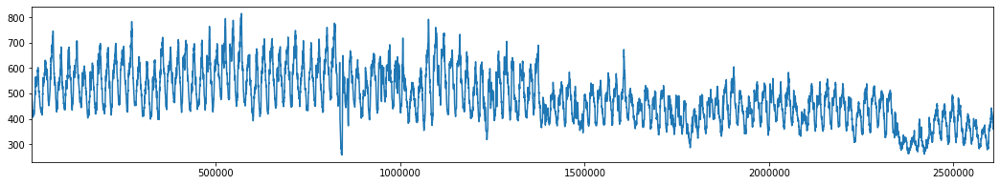

495-1263


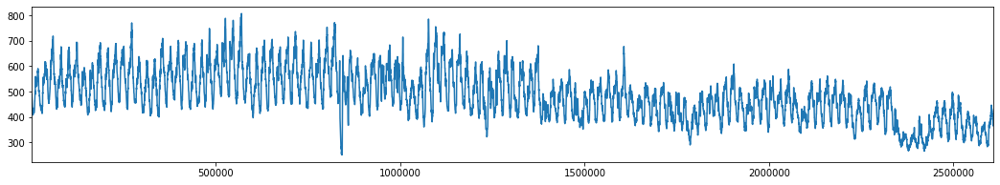

495-1264


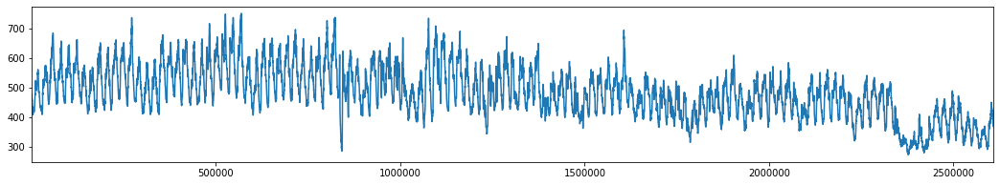

495-1265


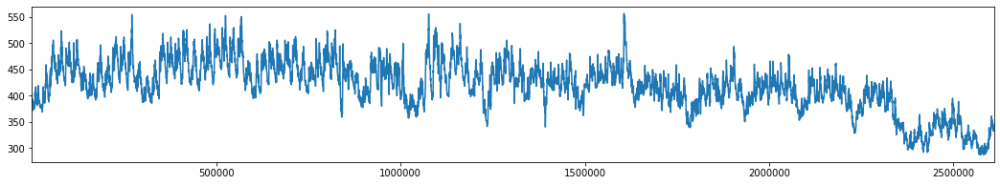

495-1266


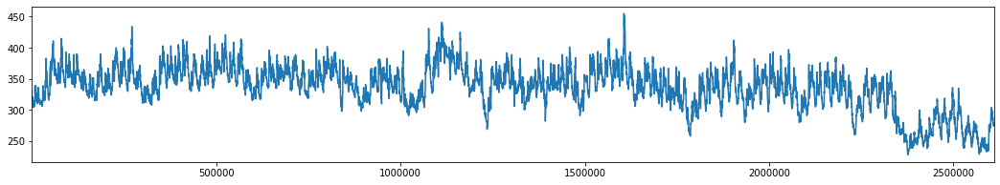

495-1267


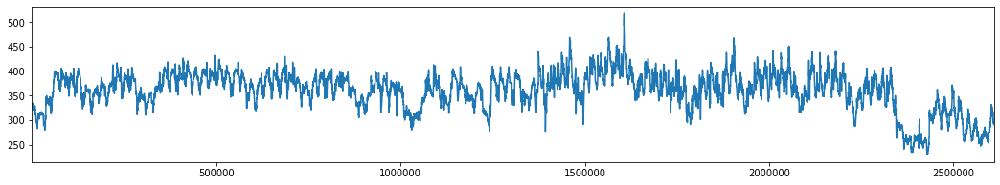

495-1268


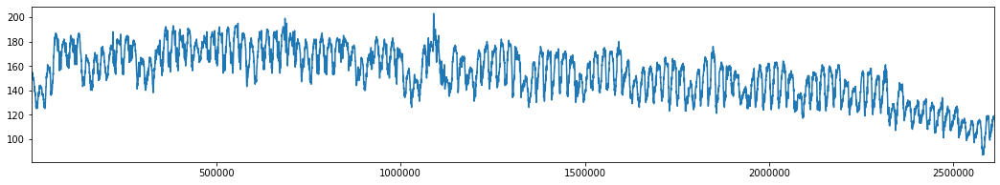

496-1252


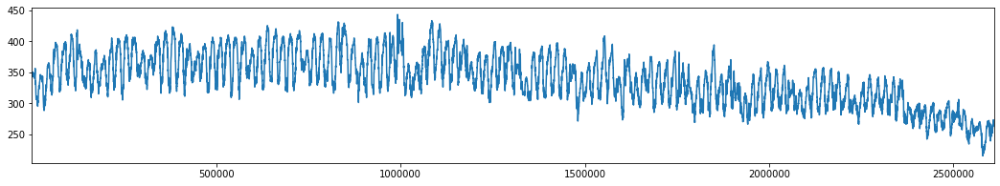

496-1253


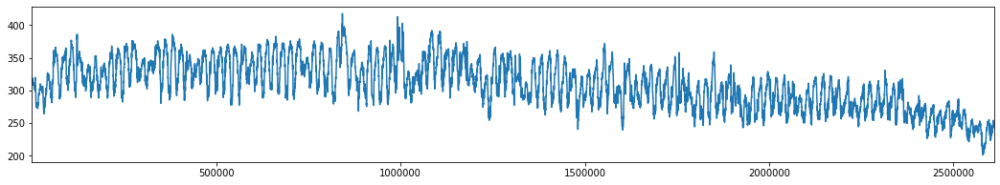

496-1254


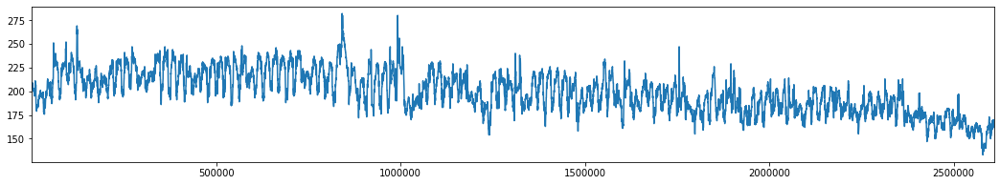

496-1255


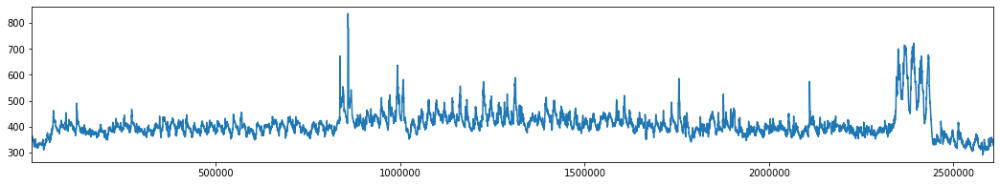

496-1256


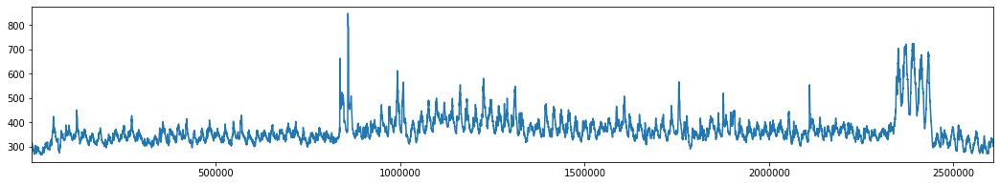

496-1257


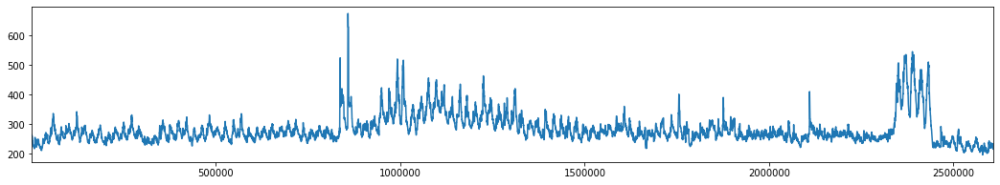

496-1258


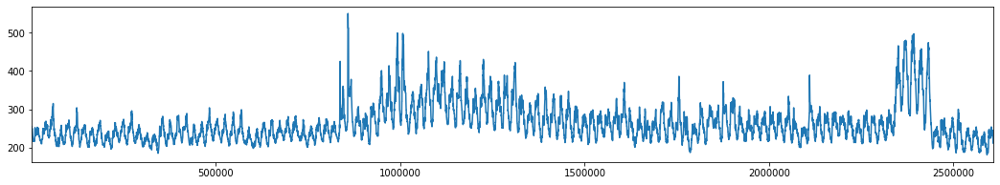

496-1259


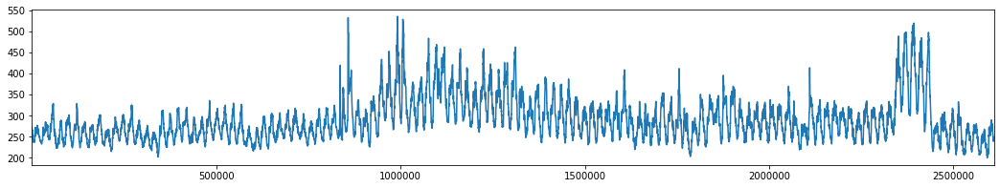

496-1260


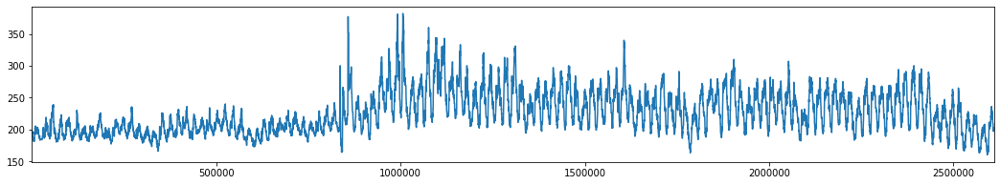

496-1261


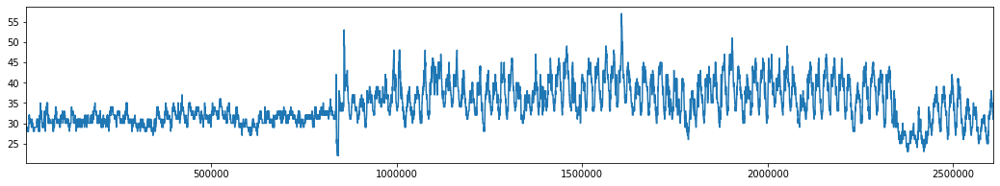

496-1262


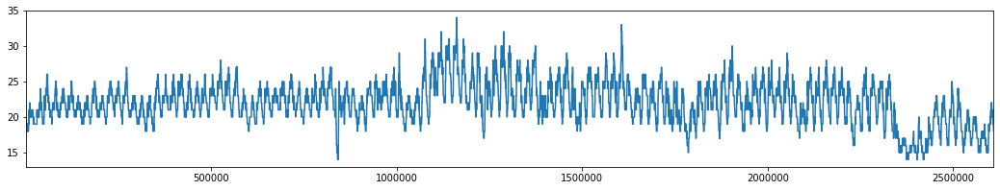

496-1263


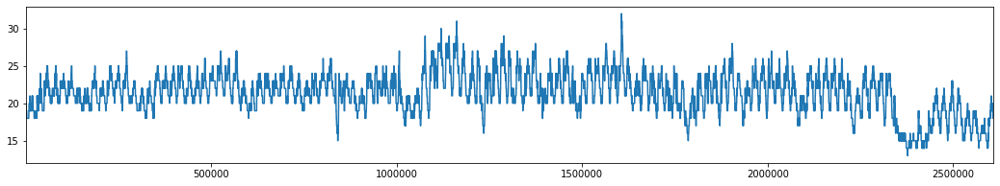

496-1264


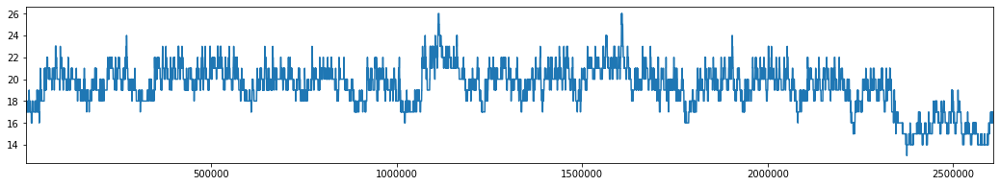

496-1265


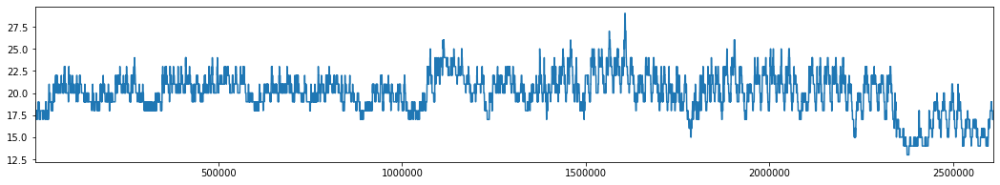

496-1266


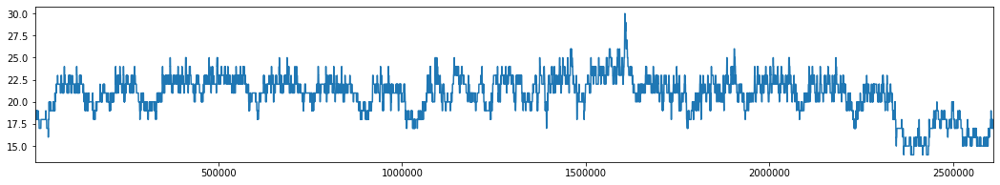

496-1267


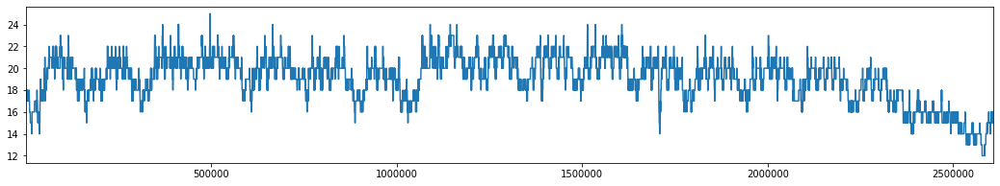

496-1268


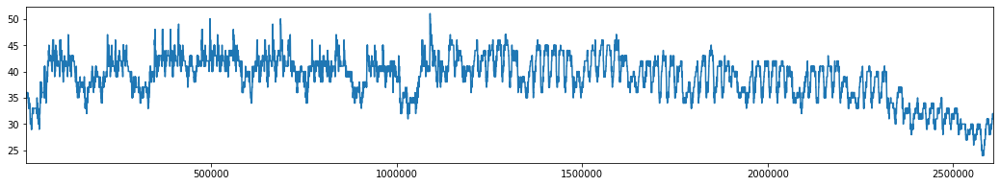

497-1252


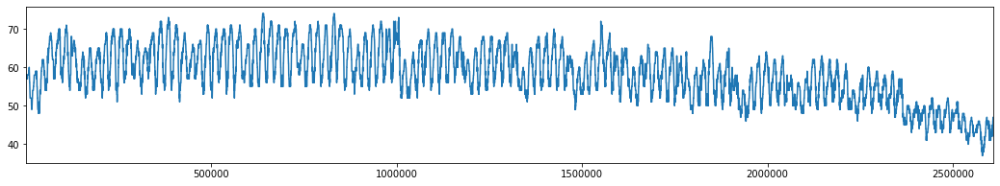

497-1253


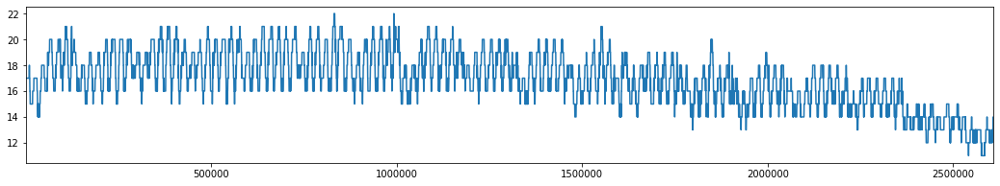

497-1254


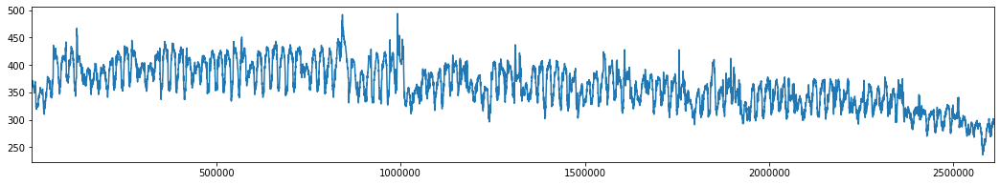

497-1255


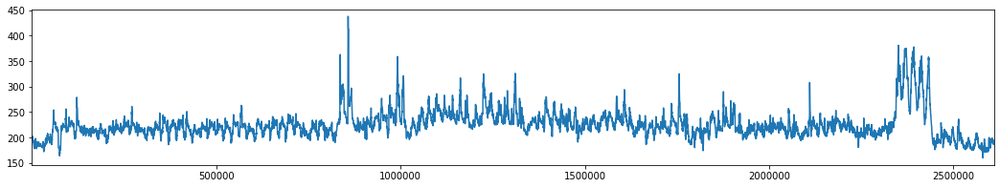

497-1256


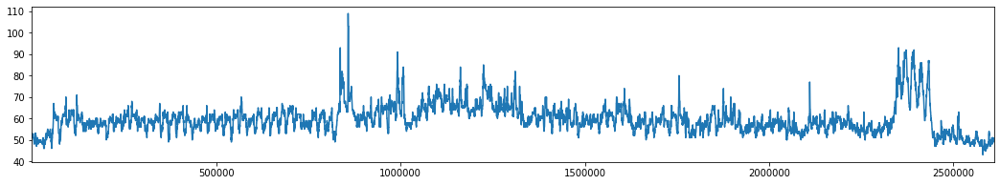

497-1257


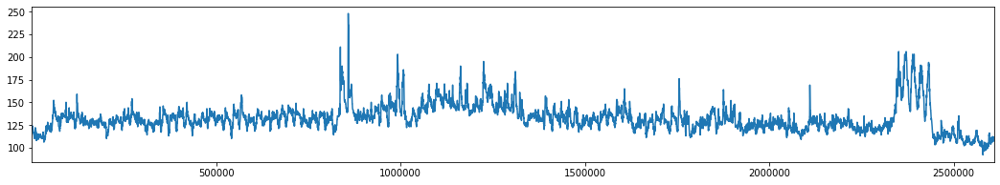

497-1258


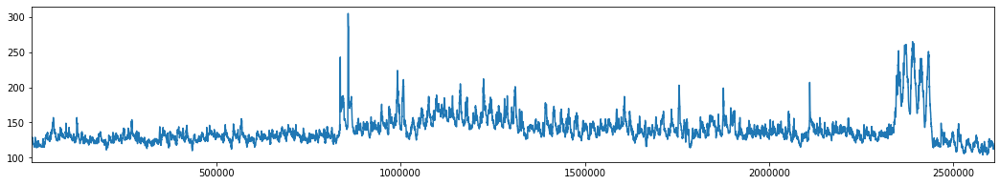

497-1259


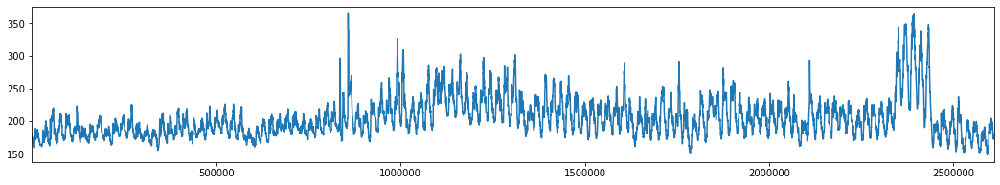

497-1260


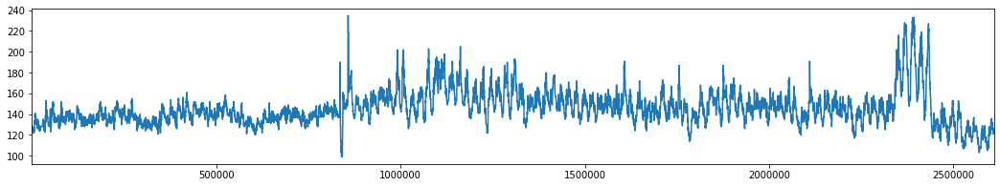

497-1261


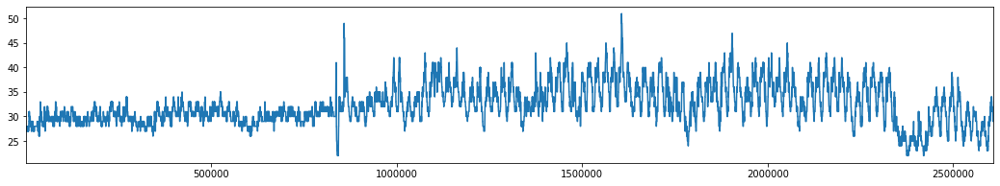

497-1262


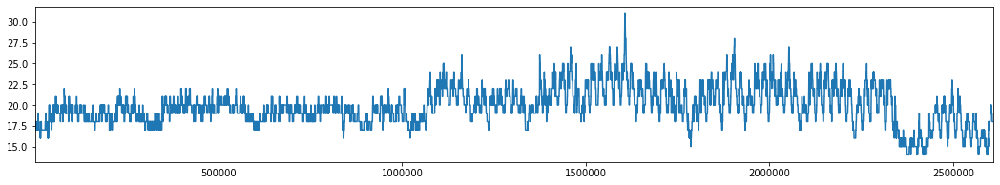

497-1263


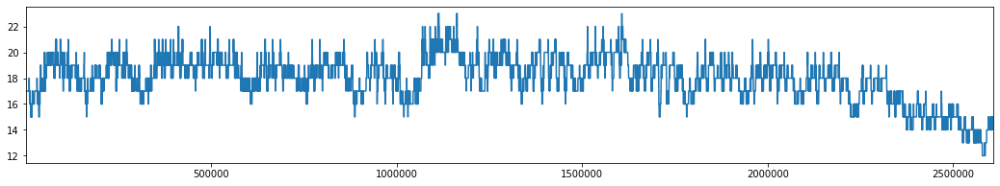

497-1264


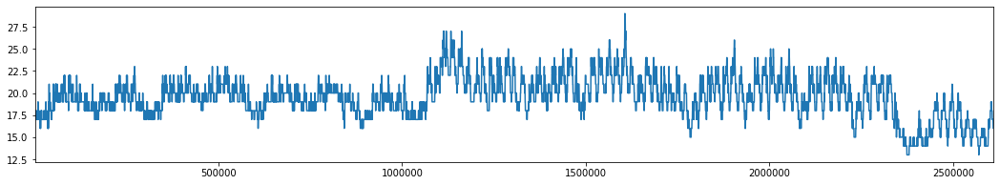

497-1265


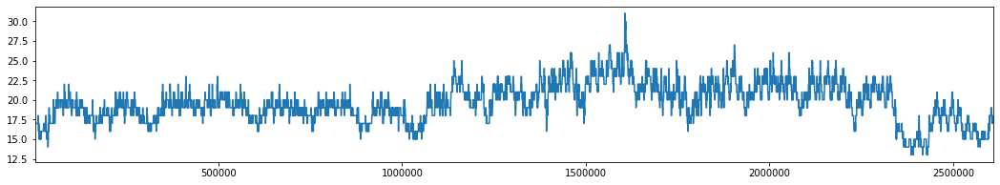

497-1266


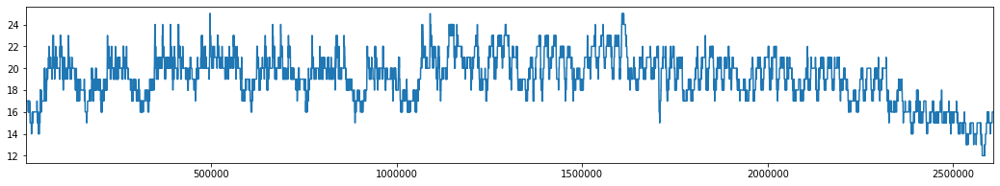

497-1267


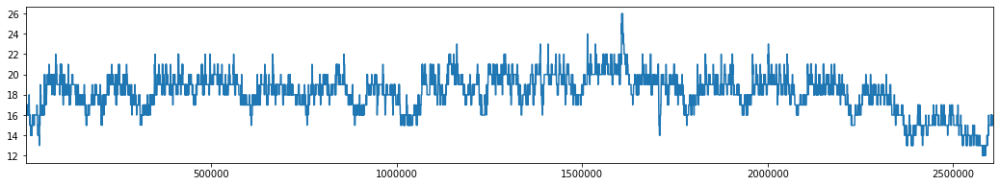

497-1268


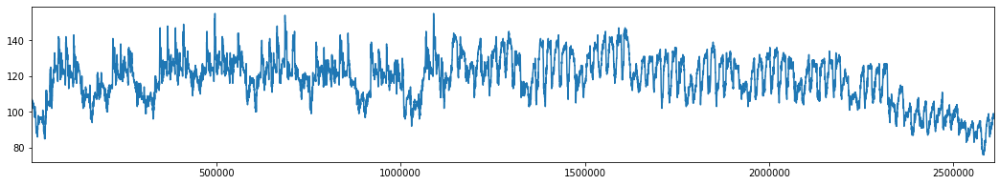

498-1252


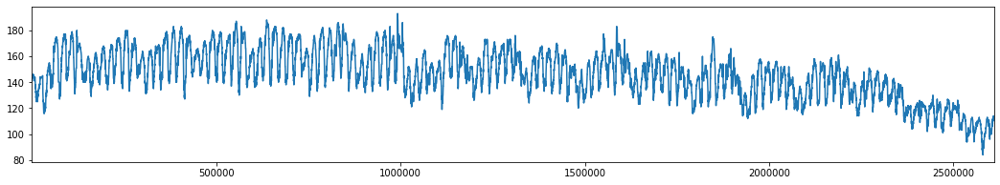

498-1253


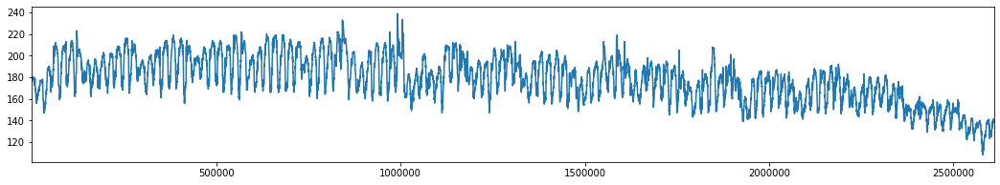

498-1254


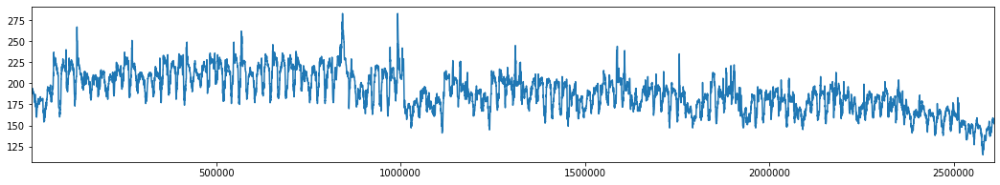

498-1255


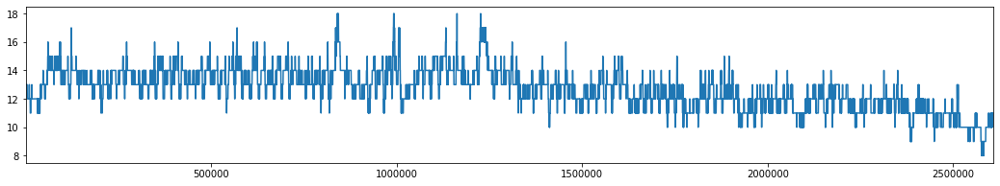

498-1256


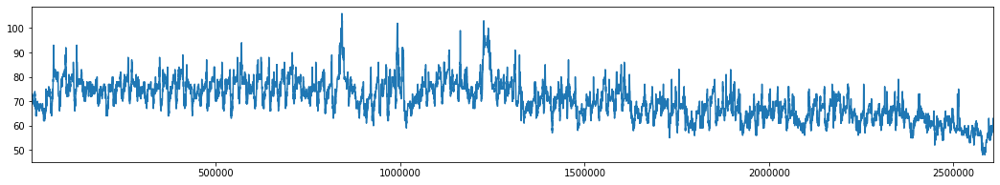

498-1257


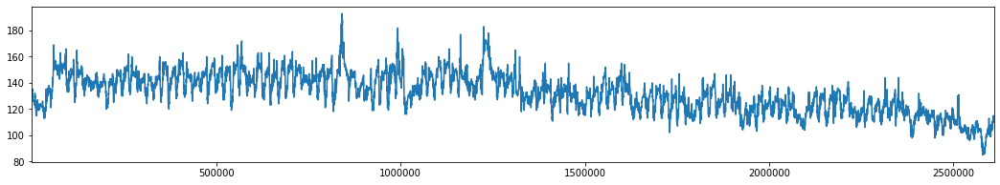

498-1258


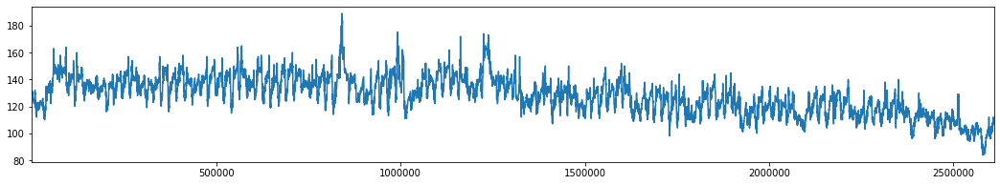

498-1259


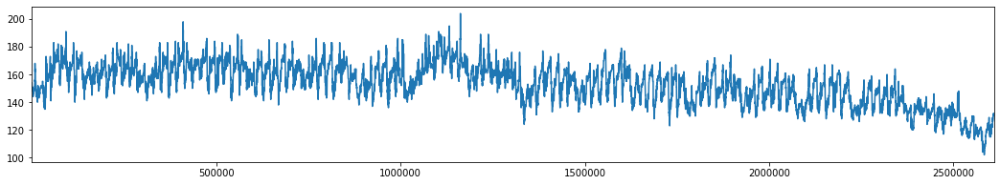

498-1260


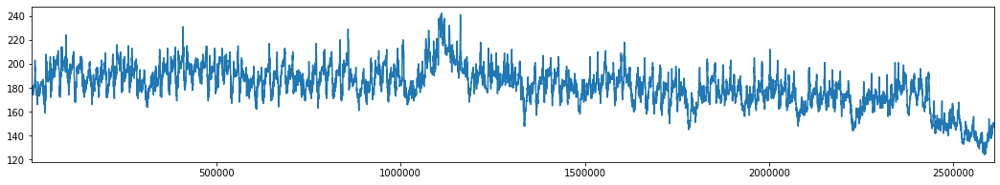

498-1261


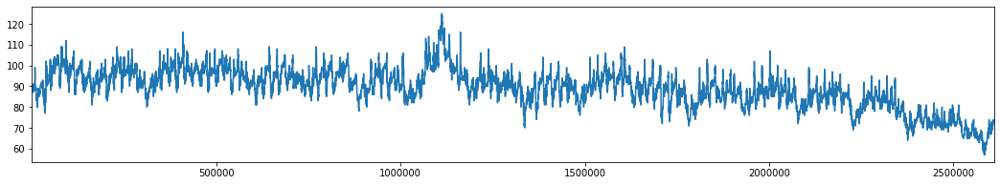

498-1262


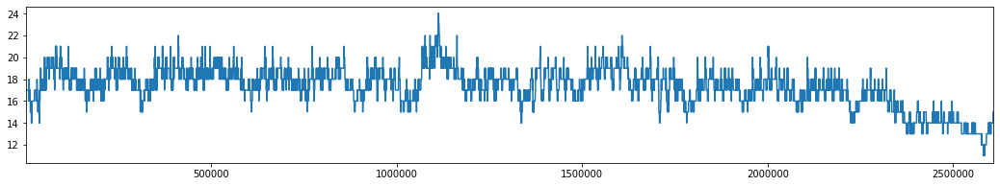

498-1263


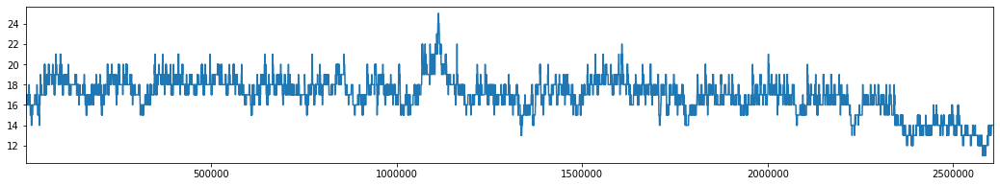

498-1264


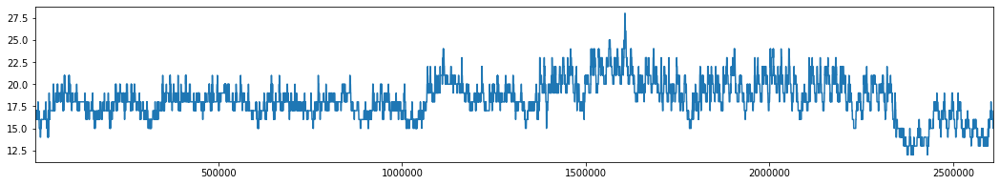

498-1265


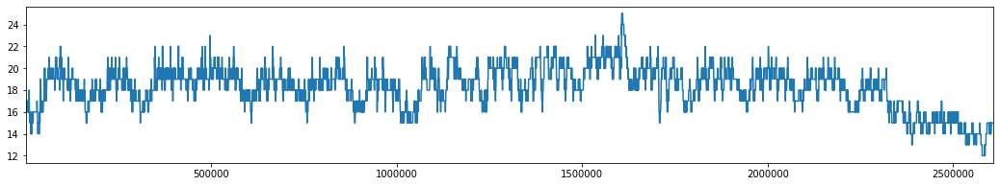

498-1266


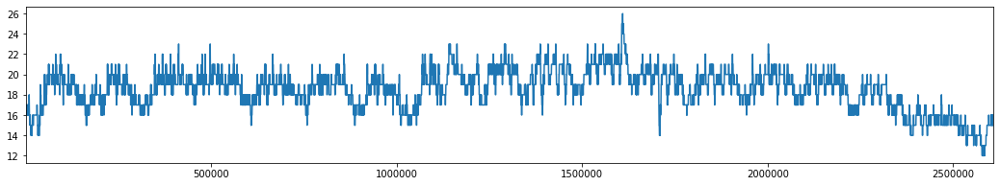

498-1267


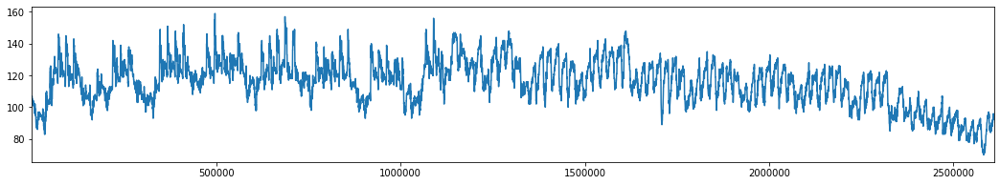

498-1268


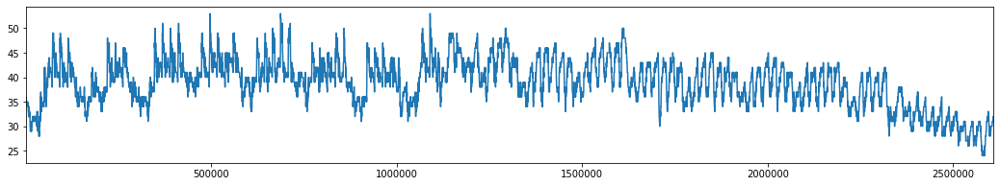

In [6]:
for i, k in agg_by_cell: 
    plt.figure(figsize = (18,3))
    print(i)
    k['nr_people'].plot()
    plt.show()

In [7]:
serie_dati = agg_by_cell.get_group('495-1266')
serie_dati = serie_dati.iloc[::4, :]

In [8]:
counter = 0
dict2data = {}
error_list = []

print(counter)
counter +=1
dates4dec = []
cell_values = []

for index, row in serie_dati.iterrows():
    
        date = row['date']
        h = str(row['hours'])
   
        h = h.split('.')
    
        if len(h[0])<2:
            h = h[1]+h[0]
        else: 
            h = h[0]
   
        minutes = str(row['minutes'])
        m = ''
        minutes = minutes.split('.')
        if len(minutes[0])<2: 
            m = minutes[0] +'0'
        else: 
            m = minutes[0]
        #print(date, h, m)
        data_f = date+' '+h+':'+m+':'+'00'
        #print(data_f)
        cell_values.append(row['nr_people'])
        dates4dec.append(data_f)  

0


In [9]:
dict_i = {'ds': dates4dec, 'y':cell_values}
data4deco = pd.DataFrame(dict_i, index=None, columns=None)  
data4deco.head()

,ds,y
0,2017-04-16 00:00:00,326.0
1,2017-04-16 01:00:00,318.0
2,2017-04-16 02:00:00,318.0
3,2017-04-16 03:00:00,312.0
4,2017-04-16 04:00:00,304.0


### STL Seasonal-Trend Loess decomposition

In [10]:
data4deco['ds'] = pd.to_datetime(data4deco['ds'])
data4deco = data4deco.set_index('ds')
data4deco.head()

,y
ds,
2017-04-16 00:00:00,326.0
2017-04-16 01:00:00,318.0
2017-04-16 02:00:00,318.0
2017-04-16 03:00:00,312.0
2017-04-16 04:00:00,304.0


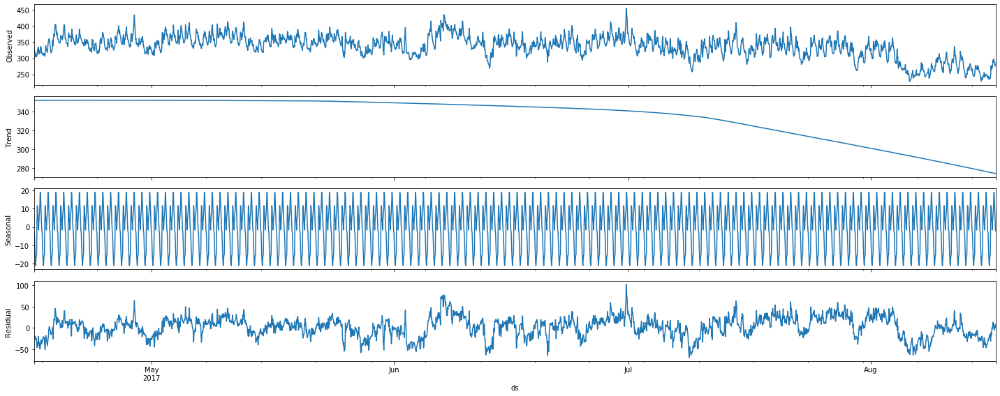

In [11]:
decomp = decompose(data4deco['y'], period=24)

with plt.rc_context():
     plt.rc("figure", figsize=(20,8))
     decomp.plot()
     plt.show()

In [12]:
trend = decomp.trend.values
#print(trend.head(2))
seasonal = decomp.seasonal.values
#print(seasonal.head(2))
residual = decomp.resid.values
#print(residual.head(2))

In [13]:
# split a univariate sequence into samples
def split_sequence(sequence, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequence)):
         # find the end of this pattern
         end_ix = i + n_steps_in
         out_end_ix = end_ix + n_steps_out
         # check if we are beyond the sequence
         if out_end_ix > len(sequence):
             break
         # gather input and output parts of the pattern
         seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
         X.append(seq_x)
         y.append(seq_y)
    return np.array(X), np.array(y)

In [14]:
def get_forcast_per_component(series, st_in, st_out, train_test_size):
    
    # split into samples
    X, y = split_sequence(series, st_in, st_out)

    train_X, test_X = X[:train_test_size], X[train_test_size:]
    train_y, test_y = y[:train_test_size], y[train_test_size:]

    # define model
    model = Sequential()
    model.add(Dense(500, activation='relu', input_dim=st_in)) 
    model.add(Dense(st_out))

    model.compile(optimizer='adam', loss='mse' , metrics=[metrics.mae, 'accuracy'])

    # fit model
    model.fit(train_X, train_y, batch_size=64, epochs=200, verbose=2)
    
    # predict 
    predicted = []
    for i in range(len(test_X)):
        x_input = test_X[i].reshape(1, st_in)
        yhat = model.predict(x_input, verbose=0)
        
        #predicted.append(np.rint(yhat[0]))   
        predicted.append(np.around(yhat[0], decimals=1)) 
    predicted = np.array(predicted)
    return predicted

In [15]:
n_steps_in, n_steps_out = 168, 12
train_test_size = 2600

forcasted_trend = get_forcast_per_component(trend, n_steps_in, n_steps_out, train_test_size)
forcasted_residual = get_forcast_per_component(residual, n_steps_in, n_steps_out, train_test_size)
forcasted_season = get_forcast_per_component(seasonal, n_steps_in, n_steps_out, train_test_size)

Epoch 1/200
41/41 - 0s - loss: 11183.9141 - mean_absolute_error: 66.0154 - accuracy: 0.0015
Epoch 2/200
41/41 - 0s - loss: 97.4773 - mean_absolute_error: 7.1388 - accuracy: 7.6923e-04
Epoch 3/200
41/41 - 0s - loss: 6.5744 - mean_absolute_error: 2.0452 - accuracy: 0.0250
Epoch 4/200
41/41 - 0s - loss: 4.8624 - mean_absolute_error: 1.7971 - accuracy: 0.0488
Epoch 5/200
41/41 - 0s - loss: 4.8883 - mean_absolute_error: 1.8105 - accuracy: 0.0812
Epoch 6/200
41/41 - 0s - loss: 4.9550 - mean_absolute_error: 1.8061 - accuracy: 0.0281
Epoch 7/200
41/41 - 0s - loss: 4.8134 - mean_absolute_error: 1.7861 - accuracy: 0.0538
Epoch 8/200
41/41 - 0s - loss: 4.8675 - mean_absolute_error: 1.7955 - accuracy: 0.0446
Epoch 9/200
41/41 - 0s - loss: 4.8664 - mean_absolute_error: 1.7933 - accuracy: 0.0212
Epoch 10/200
41/41 - 0s - loss: 4.8357 - mean_absolute_error: 1.7957 - accuracy: 0.0727
Epoch 11/200
41/41 - 0s - loss: 4.7149 - mean_absolute_error: 1.7779 - accuracy: 0.0996
Epoch 12/200
41/41 - 0s - loss:

Epoch 94/200
41/41 - 0s - loss: 4.6714 - mean_absolute_error: 1.7333 - accuracy: 0.0542
Epoch 95/200
41/41 - 0s - loss: 7.4505 - mean_absolute_error: 2.1749 - accuracy: 0.2350
Epoch 96/200
41/41 - 0s - loss: 30.2439 - mean_absolute_error: 4.0435 - accuracy: 0.1796
Epoch 97/200
41/41 - 0s - loss: 3.4357 - mean_absolute_error: 1.4329 - accuracy: 0.0123
Epoch 98/200
41/41 - 0s - loss: 19.7794 - mean_absolute_error: 3.0775 - accuracy: 0.0069
Epoch 99/200
41/41 - 0s - loss: 2.6225 - mean_absolute_error: 1.2988 - accuracy: 0.0773
Epoch 100/200
41/41 - 0s - loss: 7.9813 - mean_absolute_error: 2.2366 - accuracy: 0.1554
Epoch 101/200
41/41 - 0s - loss: 5.8812 - mean_absolute_error: 1.9719 - accuracy: 0.2177
Epoch 102/200
41/41 - 0s - loss: 24.7613 - mean_absolute_error: 3.7510 - accuracy: 0.2092
Epoch 103/200
41/41 - 0s - loss: 4.5827 - mean_absolute_error: 1.7078 - accuracy: 0.0908
Epoch 104/200
41/41 - 0s - loss: 16.5196 - mean_absolute_error: 3.2295 - accuracy: 0.0796
Epoch 105/200
41/41 - 0

Epoch 186/200
41/41 - 0s - loss: 7.2127 - mean_absolute_error: 2.2042 - accuracy: 0.0869
Epoch 187/200
41/41 - 0s - loss: 10.3787 - mean_absolute_error: 2.3210 - accuracy: 3.8462e-04
Epoch 188/200
41/41 - 0s - loss: 0.8716 - mean_absolute_error: 0.7499 - accuracy: 0.0708
Epoch 189/200
41/41 - 0s - loss: 4.1864 - mean_absolute_error: 1.5942 - accuracy: 0.0065
Epoch 190/200
41/41 - 0s - loss: 10.3335 - mean_absolute_error: 2.6343 - accuracy: 0.0423
Epoch 191/200
41/41 - 0s - loss: 2.7115 - mean_absolute_error: 1.3410 - accuracy: 0.0662
Epoch 192/200
41/41 - 0s - loss: 7.0028 - mean_absolute_error: 1.9643 - accuracy: 0.2408
Epoch 193/200
41/41 - 0s - loss: 4.4822 - mean_absolute_error: 1.5308 - accuracy: 0.0331
Epoch 194/200
41/41 - 0s - loss: 6.1161 - mean_absolute_error: 1.6724 - accuracy: 0.0227
Epoch 195/200
41/41 - 0s - loss: 3.9731 - mean_absolute_error: 1.5326 - accuracy: 0.0012
Epoch 196/200
41/41 - 0s - loss: 10.9422 - mean_absolute_error: 2.5637 - accuracy: 0.0081
Epoch 197/200


Epoch 78/200
41/41 - 0s - loss: 17.7363 - mean_absolute_error: 3.2912 - accuracy: 0.6146
Epoch 79/200
41/41 - 0s - loss: 20.0824 - mean_absolute_error: 3.4796 - accuracy: 0.6004
Epoch 80/200
41/41 - 0s - loss: 22.0222 - mean_absolute_error: 3.6230 - accuracy: 0.6019
Epoch 81/200
41/41 - 0s - loss: 17.9100 - mean_absolute_error: 3.3079 - accuracy: 0.6138
Epoch 82/200
41/41 - 0s - loss: 15.8912 - mean_absolute_error: 3.1205 - accuracy: 0.6227
Epoch 83/200
41/41 - 0s - loss: 15.5909 - mean_absolute_error: 3.0948 - accuracy: 0.6200
Epoch 84/200
41/41 - 0s - loss: 17.2215 - mean_absolute_error: 3.2458 - accuracy: 0.6200
Epoch 85/200
41/41 - 0s - loss: 18.6038 - mean_absolute_error: 3.3623 - accuracy: 0.6327
Epoch 86/200
41/41 - 0s - loss: 18.1240 - mean_absolute_error: 3.3216 - accuracy: 0.6315
Epoch 87/200
41/41 - 0s - loss: 20.1947 - mean_absolute_error: 3.4729 - accuracy: 0.6262
Epoch 88/200
41/41 - 0s - loss: 16.8782 - mean_absolute_error: 3.2020 - accuracy: 0.6385
Epoch 89/200
41/41 - 

Epoch 170/200
41/41 - 0s - loss: 9.0372 - mean_absolute_error: 2.3065 - accuracy: 0.7523
Epoch 171/200
41/41 - 0s - loss: 5.3758 - mean_absolute_error: 1.8057 - accuracy: 0.7762
Epoch 172/200
41/41 - 0s - loss: 4.4709 - mean_absolute_error: 1.6506 - accuracy: 0.7962
Epoch 173/200
41/41 - 0s - loss: 4.6952 - mean_absolute_error: 1.6870 - accuracy: 0.7838
Epoch 174/200
41/41 - 0s - loss: 4.7166 - mean_absolute_error: 1.6825 - accuracy: 0.7850
Epoch 175/200
41/41 - 0s - loss: 6.8596 - mean_absolute_error: 2.0054 - accuracy: 0.7762
Epoch 176/200
41/41 - 0s - loss: 6.0002 - mean_absolute_error: 1.8969 - accuracy: 0.7573
Epoch 177/200
41/41 - 0s - loss: 6.4749 - mean_absolute_error: 1.9507 - accuracy: 0.7881
Epoch 178/200
41/41 - 0s - loss: 5.9836 - mean_absolute_error: 1.8922 - accuracy: 0.7912
Epoch 179/200
41/41 - 0s - loss: 8.3110 - mean_absolute_error: 2.1962 - accuracy: 0.7812
Epoch 180/200
41/41 - 0s - loss: 6.6765 - mean_absolute_error: 1.9938 - accuracy: 0.7762
Epoch 181/200
41/41 -

Epoch 61/200
41/41 - 0s - loss: 0.3133 - mean_absolute_error: 0.4336 - accuracy: 0.9104
Epoch 62/200
41/41 - 0s - loss: 0.3515 - mean_absolute_error: 0.4671 - accuracy: 0.9504
Epoch 63/200
41/41 - 0s - loss: 0.3716 - mean_absolute_error: 0.4720 - accuracy: 0.9254
Epoch 64/200
41/41 - 0s - loss: 0.1966 - mean_absolute_error: 0.3423 - accuracy: 0.9588
Epoch 65/200
41/41 - 0s - loss: 0.0635 - mean_absolute_error: 0.1941 - accuracy: 0.9950
Epoch 66/200
41/41 - 0s - loss: 0.0271 - mean_absolute_error: 0.1281 - accuracy: 1.0000
Epoch 67/200
41/41 - 0s - loss: 0.0167 - mean_absolute_error: 0.0997 - accuracy: 1.0000
Epoch 68/200
41/41 - 0s - loss: 0.0101 - mean_absolute_error: 0.0779 - accuracy: 1.0000
Epoch 69/200
41/41 - 0s - loss: 0.0104 - mean_absolute_error: 0.0789 - accuracy: 1.0000
Epoch 70/200
41/41 - 0s - loss: 0.0069 - mean_absolute_error: 0.0643 - accuracy: 1.0000
Epoch 71/200
41/41 - 0s - loss: 0.0080 - mean_absolute_error: 0.0700 - accuracy: 1.0000
Epoch 72/200
41/41 - 0s - loss: 

Epoch 154/200
41/41 - 0s - loss: 0.1491 - mean_absolute_error: 0.3026 - accuracy: 0.9842
Epoch 155/200
41/41 - 0s - loss: 0.0776 - mean_absolute_error: 0.2158 - accuracy: 0.9981
Epoch 156/200
41/41 - 0s - loss: 0.0770 - mean_absolute_error: 0.2141 - accuracy: 0.9888
Epoch 157/200
41/41 - 0s - loss: 0.0498 - mean_absolute_error: 0.1746 - accuracy: 1.0000
Epoch 158/200
41/41 - 0s - loss: 0.0582 - mean_absolute_error: 0.1857 - accuracy: 0.9985
Epoch 159/200
41/41 - 0s - loss: 0.0302 - mean_absolute_error: 0.1349 - accuracy: 1.0000
Epoch 160/200
41/41 - 0s - loss: 0.0364 - mean_absolute_error: 0.1457 - accuracy: 1.0000
Epoch 161/200
41/41 - 0s - loss: 0.0253 - mean_absolute_error: 0.1216 - accuracy: 1.0000
Epoch 162/200
41/41 - 0s - loss: 0.0262 - mean_absolute_error: 0.1248 - accuracy: 1.0000
Epoch 163/200
41/41 - 0s - loss: 0.0430 - mean_absolute_error: 0.1555 - accuracy: 1.0000
Epoch 164/200
41/41 - 0s - loss: 0.0734 - mean_absolute_error: 0.2098 - accuracy: 0.9977
Epoch 165/200
41/41 -

In [16]:
type(forcasted_trend)

numpy.ndarray

In [17]:
final_prediction = forcasted_trend + forcasted_residual + forcasted_season

In [18]:
X, y = split_sequence(serie_dati['nr_people'].values, n_steps_in, n_steps_out) 


In [19]:
train_X, train_y = X[:train_test_size], X[train_test_size:]
train_y, test_y = y[:train_test_size], y[train_test_size:]

In [20]:
print(final_prediction.shape)
expected = test_y
print(expected.shape)

(173, 12)
(173, 12)


In [21]:
difference = abs(expected - final_prediction)

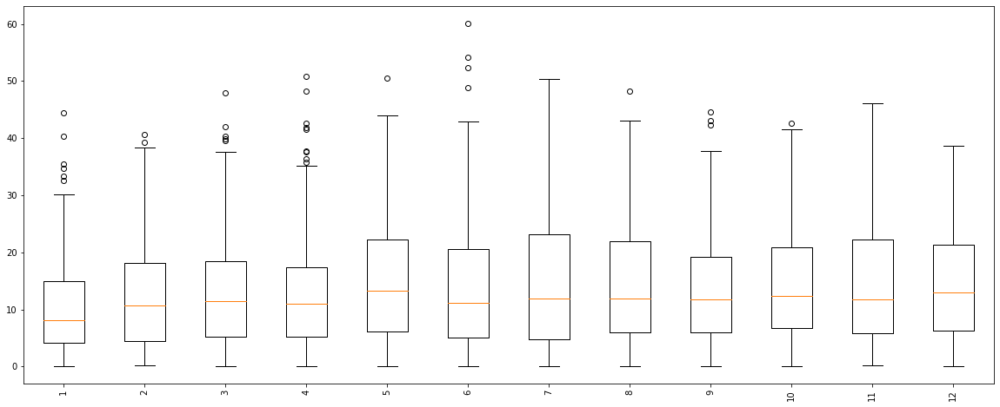

In [22]:
plt.figure(figsize = (20,8))
plt.boxplot(difference, vert= True);
plt.xticks( rotation='vertical')
plt.show()

Mean error 13.786416232011682


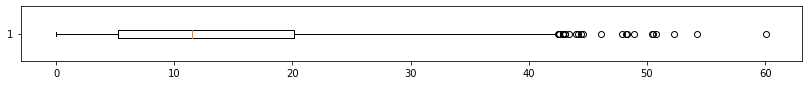

Valori cella


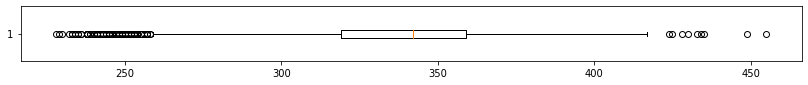

In [23]:
mean_error =  np.reshape(difference, difference.shape[0] * difference.shape[1])
print('Mean error', np.mean(mean_error))
plt.figure(figsize = (14,1))
plt.boxplot(mean_error, vert= False);
plt.show()
print('Valori cella')
plt.figure(figsize = (14, 1))
plt.boxplot(serie_dati['nr_people'].values, vert = False)
plt.show()

In [24]:
power_err = np.power(mean_error, 2)
import math 
rmse = math.sqrt(np.mean(power_err))
print(rmse)

17.395201495563207
